In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from typing import Dict
from torchvision.ops import StochasticDepth

# ===================================================================
# SECTION B: RGB Branch (ConvNeXtV2-Nano Backend)
# ===================================================================

class LayerNorm(nn.Module):
    """ LayerNorm that supports two data formats: channels_last (N, H, W, C) and channels_first (N, C, H, W). """
    def __init__(self, normalized_shape, eps=1e-5, data_format="channels_first"):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
        self.eps = eps
        self.data_format = data_format
        if self.data_format not in ["channels_last", "channels_first"]:
            raise NotImplementedError
        self.normalized_shape = (normalized_shape,)

    def forward(self, x):
        if self.data_format == "channels_last":
            return F.layer_norm(x, self.normalized_shape, self.weight, self.bias, self.eps)
        elif self.data_format == "channels_first":
            u = x.mean(1, keepdim=True)
            s = (x - u).pow(2).mean(1, keepdim=True)
            x = (x - u) / torch.sqrt(s + self.eps)
            x = self.weight[:, None, None] * x + self.bias[:, None, None]
            return x

class GRN(nn.Module):
    """ Global Response Normalization layer from ConvNeXtV2. """
    def __init__(self, dim):
        super().__init__()
        self.gamma = nn.Parameter(torch.zeros(1, 1, 1, dim))
        self.beta = nn.Parameter(torch.zeros(1, 1, 1, dim))

    def forward(self, x):
        Gx = torch.norm(x, p=2, dim=(1, 2), keepdim=True)
        Nx = Gx / (Gx.mean(dim=-1, keepdim=True) + 1e-6)
        return self.gamma * (x * Nx) + self.beta + x

class ConvNeXtV2Block(nn.Module):
    """ The main building block for the ConvNeXtV2 backbone. """
    def __init__(self, dim, drop_path_rate=0.0):
        super().__init__()
        self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
        self.norm = LayerNorm(dim, eps=1e-5, data_format="channels_first")
        self.pwconv1 = nn.Linear(dim, 4 * dim)
        self.act = nn.GELU()
        self.grn = GRN(4 * dim)
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.drop_path = StochasticDepth(p=drop_path_rate, mode='row') if drop_path_rate > 0. else nn.Identity()

    def forward(self, x):
        identity = x
        x_main = self.dwconv(x)
        x_main = self.norm(x_main)
        x_main = x_main.permute(0, 2, 3, 1)
        x_main = self.pwconv1(x_main)
        x_main = self.act(x_main)
        x_main = self.grn(x_main)
        x_main = self.pwconv2(x_main)
        x_main = x_main.permute(0, 3, 1, 2)
        x = identity + self.drop_path(x_main)
        return x

class RGBBranch(nn.Module):
    """ Extracts multi-scale semantic features using a ConvNeXtV2-Nano backbone. """
    def __init__(self, depths=[3, 3, 9, 3], dims=[80, 160, 320, 640], drop_path_rate=0.0):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv2d(3, dims[0], kernel_size=4, stride=4),
            LayerNorm(dims[0], eps=1e-5, data_format="channels_first")
        )
        self.downsample_layers = nn.ModuleList()
        for i in range(3):
            stride = 2
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-5, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=stride),
            )
            self.downsample_layers.append(downsample_layer)

        self.stages = nn.ModuleList()
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]

        for i in range(4):
            stage_dpr = dpr[sum(depths[:i]):sum(depths[:i+1])]
            stage = nn.Sequential(
                *[ConvNeXtV2Block(dim=dims[i], drop_path_rate=stage_dpr[j]) for j in range(depths[i])]
            )
            self.stages.append(stage)

        self.adapters = nn.ModuleList([
            nn.Conv2d(dims[0], 256, 1),
            nn.Conv2d(dims[1], 512, 1),
            nn.Conv2d(dims[2], 1024, 1),
            nn.Conv2d(dims[3], 2048, 1)
        ])

    def forward(self, x):
        s1 = self.stages[0](self.stem(x))
        f1 = self.adapters[0](s1)
        x = self.downsample_layers[0](s1)
        s2 = self.stages[1](x)
        f2 = self.adapters[1](s2)
        x = self.downsample_layers[1](s2)
        s3 = self.stages[2](x)
        f3 = self.adapters[2](s3)
        x = self.downsample_layers[2](s3)
        s4 = self.stages[3](x)
        f4 = self.adapters[3](s4)
        return f1, f2, f3, f4

# ===================================================================
# SECTION C: Noise Branch (Hybrid ConvFormer)
# ===================================================================

class LearnableConstrainedBayerConv2d(nn.Module):
    """
    A learnable convolutional layer where high-pass filter constraints
    are enforced. This version is compatible with torch.compile.
    """
    def __init__(self, in_channels=3, out_channels=3, kernel_size=3):
        super().__init__()
        self.kernel_size = kernel_size
        self.padding = kernel_size // 2
        self.weight = nn.Parameter(torch.zeros(out_channels, in_channels, kernel_size, kernel_size))
        self.reset_parameters()

    def reset_parameters(self):
        with torch.no_grad():
            nn.init.xavier_uniform_(self.weight)
            center = self.kernel_size // 2
            self.weight.data[:, :, center, center] = -1.0
        self.weight.requires_grad = True

    def forward(self, x):
        # Create a new, temporary constrained weight tensor on the fly.
        # This avoids in-place modification and is compile-friendly.
        center = self.kernel_size // 2
        
        # Isolate the off-center weights from the learnable parameter
        off_center_weights = self.weight.clone()
        off_center_weights[:, :, center, center] = 0
        
        # Calculate the sum for normalization
        sum_off_center = torch.sum(off_center_weights, dim=(2, 3), keepdim=True)
        
        # Create the normalized off-center weights
        normalized_off_center = off_center_weights / (sum_off_center + 1e-9)
        
        # Combine to create the final constrained weight for this forward pass
        constrained_weight = normalized_off_center
        constrained_weight[:, :, center, center] = -1.0
        
        # Use the temporary, constrained weight for the convolution
        return F.conv2d(x, constrained_weight, padding=self.padding)

class WindowAttention(nn.Module):
    """ The core windowed multi-head self-attention module for Swin Transformer. """
    def __init__(self, dim, window_size, num_heads):
        super().__init__()
        self.window_size = window_size
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = head_dim ** -0.5
        self.relative_position_bias_table = nn.Parameter(torch.zeros((2 * window_size - 1)**2, num_heads))
        coords = torch.stack(torch.meshgrid([torch.arange(window_size), torch.arange(window_size)], indexing='ij'))
        coords_flatten = torch.flatten(coords, 1)
        relative_coords = coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = relative_coords.permute(1, 2, 0).contiguous()
        relative_coords[:, :, 0] += window_size - 1
        relative_coords[:, :, 1] += window_size - 1
        relative_coords[:, :, 0] *= 2 * window_size - 1
        self.register_buffer("relative_position_index", relative_coords.sum(-1))
        self.qkv = nn.Linear(dim, dim * 3)
        self.proj = nn.Linear(dim, dim)
        nn.init.trunc_normal_(self.relative_position_bias_table, std=.02)

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn = (q * self.scale @ k.transpose(-2, -1))
        relative_position_bias = self.relative_position_bias_table[self.relative_position_index.view(-1)].view(self.window_size**2, self.window_size**2, -1).permute(2, 0, 1).contiguous()
        attn = attn + relative_position_bias.unsqueeze(0)
        attn = attn.softmax(dim=-1)
        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        return self.proj(x)

class SwinTransformerBlock(nn.Module):
    """ The main building block for the Swin Transformer. """
    def __init__(self, dim, num_heads, window_size, shift_size=0, drop_path_rate=0.0, dropout_rate=0.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = WindowAttention(dim, window_size, num_heads)
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, 4 * dim),
            nn.GELU(),
            nn.Dropout(dropout_rate),
            nn.Linear(4 * dim, dim),
            nn.Dropout(dropout_rate)
        )
        self.shift_size = shift_size
        self.window_size = window_size
        self.drop_path = StochasticDepth(p=drop_path_rate, mode='row') if drop_path_rate > 0. else nn.Identity()

    def forward(self, x):
        B, N, C = x.shape
        H = W = int(math.sqrt(N))
        shortcut = x
        x_main = self.norm1(x).view(B, H, W, C)
        if self.shift_size > 0:
            shifted_x = torch.roll(x_main, shifts=(-self.shift_size, -self.shift_size), dims=(1, 2))
        else:
            shifted_x = x_main
        x_windows = shifted_x.view(B, H // self.window_size, self.window_size, W // self.window_size, self.window_size, C).permute(0, 1, 3, 2, 4, 5).contiguous().view(-1, self.window_size**2, C)
        attn_windows = self.attn(x_windows)
        shifted_x = attn_windows.view(B, H // self.window_size, W // self.window_size, self.window_size, self.window_size, -1).permute(0, 1, 3, 2, 4, 5).contiguous().view(B, H, W, C)
        if self.shift_size > 0:
            x_main = torch.roll(shifted_x, shifts=(self.shift_size, self.shift_size), dims=(1, 2))
        else:
            x_main = shifted_x
        x_main = x_main.view(B, N, C)
        x = shortcut + self.drop_path(x_main)
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x

class PatchMerging(nn.Module):
    """ Downsamples the feature map in the Swin Transformer by merging patches. """
    def __init__(self, dim):
        super().__init__()
        self.norm = nn.LayerNorm(4 * dim)
        self.reduction = nn.Linear(4 * dim, 2 * dim, bias=False)

    def forward(self, x):
        B, N, C = x.shape
        H = W = int(math.sqrt(N))
        x = x.view(B, H, W, C)
        x = torch.cat([x[:, 0::2, 0::2, :], x[:, 1::2, 0::2, :], x[:, 0::2, 1::2, :], x[:, 1::2, 1::2, :]], -1)
        x = x.view(B, -1, 4 * C)
        return self.reduction(self.norm(x))

class NoiseBranch(nn.Module):
    """ A '2025' hybrid "ConvFormer" Noise Branch, tuned to a lightweight '-Nano' configuration. """
    def __init__(self, in_chans=3, embed_dim=80, depths=[2, 6], num_heads=[5, 10], drop_path_rate=0.0, dropout_rate=0.0):
        super().__init__()
        self.noise_extraction = LearnableConstrainedBayerConv2d()
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths) + 2)]
        self.cnn_stage1 = nn.Sequential(
            nn.Conv2d(in_chans, embed_dim, kernel_size=4, stride=4),
            LayerNorm(embed_dim, data_format="channels_first"),
            ConvNeXtV2Block(dim=embed_dim, drop_path_rate=dpr[0])
        )
        self.cnn_downsample = nn.Sequential(
            LayerNorm(embed_dim, data_format="channels_first"),
            nn.Conv2d(embed_dim, embed_dim * 2, kernel_size=2, stride=2)
        )
        self.cnn_stage2 = ConvNeXtV2Block(dim=embed_dim * 2, drop_path_rate=dpr[1])
        dim = embed_dim * 2
        self.patch_merge3 = PatchMerging(dim)
        dim *= 2
        stage3_dpr = dpr[2:2+depths[0]]
        self.swin_stage3 = nn.Sequential(
            *[SwinTransformerBlock(dim=dim, num_heads=num_heads[0], window_size=8,
                                    shift_size=0 if (j % 2 == 0) else 4,
                                    drop_path_rate=stage3_dpr[j], dropout_rate=dropout_rate) for j in range(depths[0])]
        )
        self.patch_merge4 = PatchMerging(dim)
        dim *= 2
        stage4_dpr = dpr[2+depths[0]:]
        self.swin_stage4 = nn.Sequential(
            *[SwinTransformerBlock(dim=dim, num_heads=num_heads[1], window_size=8,
                                    shift_size=0 if (j % 2 == 0) else 4,
                                    drop_path_rate=stage4_dpr[j], dropout_rate=dropout_rate) for j in range(depths[1])]
        )
        self.norm = nn.LayerNorm(dim)

    def forward(self, x):
        noise_map = self.noise_extraction(x)
        x = self.cnn_stage1(noise_map)
        x = self.cnn_downsample(x)
        x = self.cnn_stage2(x)
        x = x.flatten(2).transpose(1, 2)
        x = self.patch_merge3(x)
        x = self.swin_stage3(x)
        x = self.patch_merge4(x)
        x = self.swin_stage4(x)
        final_features = self.norm(x)
        return noise_map, final_features

# ===================================================================
# SECTION D, E, F: Fusion, Decoder, and Edge Modules
# ===================================================================

class DeformableAttention(nn.Module):
    """ An efficient multi-head deformable attention module for cross-modal fusion. """
    def __init__(self, channels, num_points=9, num_heads=8):
        super().__init__()
        assert channels % num_heads == 0, "channels must be divisible by num_heads"
        self.num_heads = num_heads
        self.num_points = num_points
        self.head_dim = channels // num_heads
        self.offset_attention_conv = nn.Conv2d(channels, num_heads * num_points * 3, kernel_size=3, padding=1, groups=num_heads)
        self.value_proj = nn.Conv2d(channels, channels, 1)
        self.output_proj = nn.Conv2d(channels, channels, 1)

    def forward(self, query: torch.Tensor, key_value: torch.Tensor) -> torch.Tensor:
        B, C, H, W = query.shape
        B_H = B * self.num_heads
        value = self.value_proj(key_value).view(B, self.num_heads, self.head_dim, H, W)
        value_resampled = value.reshape(B_H, self.head_dim, H, W)
        offset_attention = self.offset_attention_conv(query)
        offset_attention = offset_attention.view(B, self.num_heads, self.num_points * 3, H, W)
        raw_offsets, att_weights = torch.split(offset_attention, [self.num_points * 2, self.num_points], dim=2)
        offsets = F.hardtanh(raw_offsets)
        offsets = offsets.view(B_H, self.num_points, 2, H, W)
        att_weights = att_weights.view(B_H, self.num_points, H * W)
        grid_y, grid_x = torch.meshgrid(torch.linspace(-1, 1, H, device=query.device), torch.linspace(-1, 1, W, device=query.device), indexing='ij')
        base_grid = torch.stack([grid_x, grid_y], dim=0)
        base_grid_expanded = base_grid.unsqueeze(0).unsqueeze(0).expand(B_H, self.num_points, -1, -1, -1)
        sampling_grid = (base_grid_expanded + offsets).permute(0, 1, 3, 4, 2)
        sampling_grid_reshaped = sampling_grid.reshape(B_H * self.num_points, H, W, 2)
        value_expanded = value_resampled.unsqueeze(1).expand(-1, self.num_points, -1, -1, -1)
        value_reshaped = value_expanded.reshape(B_H * self.num_points, self.head_dim, H, W)
        sampled_features = F.grid_sample(value_reshaped, sampling_grid_reshaped, align_corners=False, padding_mode='border')
        sampled_features = sampled_features.view(B_H, self.num_points, self.head_dim, H * W)
        att_weights = att_weights.view(B_H, self.num_points, 1, H * W)
        output_features = (sampled_features * att_weights).sum(dim=1)
        output_features = output_features.view(B, C, H, W)
        return self.output_proj(output_features)

class MultiScaleCoordinateAttention(nn.Module):
    """ A standalone, reusable MSCA module that fuses Coordinate and Strip Pooling attention. """
    def __init__(self, channels, reduction=32):
        super().__init__()
        mip = max(8, channels // reduction)
        self.pool_h = nn.AdaptiveAvgPool2d((None, 1))
        self.pool_w = nn.AdaptiveAvgPool2d((1, None))
        self.conv1_ca = nn.Conv2d(channels, mip, 1)
        self.bn1_ca = LayerNorm(mip, data_format="channels_first")
        self.act_ca = nn.Hardswish()
        self.conv_h = nn.Conv2d(mip, channels, 1)
        self.conv_w = nn.Conv2d(mip, channels, 1)
        self.strip_pool = nn.Sequential(
            nn.Conv2d(channels, channels, (1, 3), padding=(0, 1), groups=channels, bias=False),
            LayerNorm(channels, data_format="channels_first"),
            nn.Conv2d(channels, channels, (3, 1), padding=(1, 0), groups=channels, bias=False),
            LayerNorm(channels, data_format="channels_first"),
            nn.Hardswish()
        )
        self.conv1_sp = nn.Conv2d(channels, mip, 1)
        self.bn1_sp = LayerNorm(mip, data_format="channels_first")
        self.act_sp = nn.Hardswish()
        self.conv2_sp = nn.Conv2d(mip, channels, 1)
        self.gate_act = nn.Hardswish()

    def forward(self, x):
        identity = x
        n, c, h, w = x.size()
        x_h = self.pool_h(x)
        x_w = self.pool_w(x).permute(0, 1, 3, 2)
        y_ca = torch.cat([x_h, x_w], dim=2)
        y_ca = self.act_ca(self.bn1_ca(self.conv1_ca(y_ca)))
        x_h_ca, x_w_ca = torch.split(y_ca, [h, w], dim=2)
        x_w_ca = x_w_ca.permute(0, 1, 3, 2)
        a_h = self.gate_act(self.conv_h(x_h_ca))
        a_w = self.gate_act(self.conv_w(x_w_ca))
        att_ca = a_w * a_h
        y_sp = self.strip_pool(x)
        y_sp = F.adaptive_avg_pool2d(y_sp, 1)
        att_sp = self.gate_act(self.conv2_sp(self.act_sp(self.bn1_sp(self.conv1_sp(y_sp)))))
        final_attention_gate = att_ca * att_sp
        return identity * final_attention_gate
    
class SpatialAttentionRefinement(nn.Module):
    """ Wraps DeformableAttention for self-attention and adds residual. """
    def __init__(self, channels, num_points=9, num_heads=2): # Set default refinement heads to 2
        super().__init__()
        # Use DeformableAttention configured for self-attention with specified heads
        self.deformable_self_attn = DeformableAttention(channels, num_points=num_points, num_heads=num_heads)
        self.norm = LayerNorm(channels, data_format="channels_first")

    def forward(self, x):
        # Query=x, KeyValue=x for self-attention
        refined_x = self.deformable_self_attn(query=x, key_value=x)
        # Add residual connection before normalization (Post-Norm)
        return self.norm(x + refined_x)

class DAMModule(nn.Module):
    """
    Fuses RGB and Noise features using targeted multi-head deformable attention (DCNv4).
    Includes 'Smart Fusion' adaptive gating (bottlenecked) to modulate noise features.
    Refines the result sequentially (Channel -> Spatial with 2 heads).
    """
    def __init__(self, semantic_dim, noise_dim, fusion_dim=512, num_heads=8, num_deform_points=9, dropout_rate=0.0):
        super().__init__()
        self.query_conv = nn.Sequential(
            nn.Conv2d(semantic_dim, fusion_dim, 1),
            nn.Dropout2d(dropout_rate) # Dropout after projection
        )
        self.value_conv = nn.Sequential(
            nn.Conv2d(noise_dim, fusion_dim, 1),
            nn.Dropout2d(dropout_rate) # Dropout after projection
        )

        # --- Efficient Adaptive Gating Module (with Bottleneck) ---
        reduction_ratio = 4
        bottleneck_dim = fusion_dim // reduction_ratio
        self.gate_generator = nn.Sequential(
            nn.Conv2d(fusion_dim, bottleneck_dim, 1, bias=False),
            LayerNorm(bottleneck_dim, data_format="channels_first"),
            nn.Hardswish(), # Activation
            nn.Conv2d(bottleneck_dim, fusion_dim, 1, bias=False),
            LayerNorm(fusion_dim, data_format="channels_first"), # Optional Norm
            nn.Hardsigmoid() # Gating Activation
        )
        # -----------------------------------------------------------------

        # --- Cross-Modal Fusion Attention (DCNv4) ---
        # Note: num_heads here is for the *fusion* attention (default 8)
        self.deformable_attn = DeformableAttention(fusion_dim, num_points=num_deform_points, num_heads=num_heads)

        self.residual_conv = nn.Sequential(
            nn.Conv2d(semantic_dim, fusion_dim, 1),
            nn.Dropout2d(dropout_rate) # Dropout after projection
        )

        # --- Sequential Refinement Layers (Channel -> Spatial) ---
        self.channel_attention = MultiScaleCoordinateAttention(fusion_dim)
        # Use 2 heads for the *refinement* spatial attention as requested
        self.spatial_attention = SpatialAttentionRefinement(fusion_dim, num_points=num_deform_points, num_heads=2)

        # --- Final Normalization ---
        self.final_norm = LayerNorm(fusion_dim, eps=1e-5, data_format="channels_first")

        # --- Removed Redundant Layers from Parallel Design ---
        # self.spatial_query_conv, self.spatial_key_conv, self.spatial_value_conv, self.softmax were removed

    def forward(self, f4, fN):
        B, _, H, W = f4.shape
        fN_H = fN_W = int(math.sqrt(fN.shape[1])) # Assumes fN is flattened sequence
        fN_reshaped = fN.transpose(1, 2).view(B, -1, fN_H, fN_W)
        fN_upsampled = F.interpolate(fN_reshaped, size=(H, W), mode='bilinear', align_corners=False)

        # 1. Prepare Query and Value with Projections & Dropout
        query = self.query_conv(f4)
        value = self.value_conv(fN_upsampled)

        # 2. Apply Adaptive Gating to Value
        gate = self.gate_generator(query)
        gated_value = value * gate

        # 3. Cross-Modal Fusion using DCNv4 Deformable Attention
        f_cross_modal = self.deformable_attn(query, gated_value)

        # 4. Add RGB Residual (with Projection & Dropout)
        f_integrated = self.residual_conv(f4) + f_cross_modal
        # Note: No separate dropout here as it's handled within residual_conv

        # 5. Sequential Refinement (Channel -> Spatial)
        # 5a. Channel Attention (MSCA - uses multiplicative gating internally)
        f_channel_refined = self.channel_attention(f_integrated)
        # 5b. Spatial Attention (Deformable Self-Attention with Additive Residual & Post-Norm)
        f_final_refined = self.spatial_attention(f_channel_refined) # Residual & Norm are inside

        # 6. Final Normalization
        output = self.final_norm(f_final_refined)

        return output

class AttentionFusionModule(nn.Module):
    """ An AFM that uses the powerful, reusable MSCA module. """
    def __init__(self, in_channels, reduction=32):
        super().__init__()
        self.msca = MultiScaleCoordinateAttention(in_channels, reduction)

    def forward(self, x):
        return self.msca(x)

class FusionUpsamplingModule(nn.Module):
    """ The FUM which contains the upgraded AFM and is modernized with LayerNorm. """
    def __init__(self, high_ch, low_ch, out_ch):
        super().__init__()
        combined_ch = high_ch + low_ch
        self.afm = AttentionFusionModule(combined_ch)
        self.conv = nn.Sequential(
            nn.Conv2d(combined_ch, out_ch, 3, padding=1, bias=False),
            LayerNorm(out_ch, eps=1e-5, data_format="channels_first"),
            nn.Hardswish()
        )
    def forward(self, high_feat, low_feat):
        high_feat = F.interpolate(high_feat, size=low_feat.shape[2:], mode='bilinear', align_corners=False)
        concatenated_feat = torch.cat([high_feat, low_feat], dim=1)
        refined_feat = self.afm(concatenated_feat)
        return self.conv(refined_feat)

class EdgeEnhancementBlock(nn.Module):
    """ A '2025' state-of-the-art block for enhancing edge features using multi-branch context. """
    def __init__(self, in_channels, bottleneck_channels=256):
        super().__init__()
        self.conv_1x1_reduce = nn.Conv2d(in_channels, bottleneck_channels, 1, bias=False)
        self.branch_fine = nn.Conv2d(bottleneck_channels, bottleneck_channels, kernel_size=3, padding=1, groups=bottleneck_channels, bias=False)
        self.branch_broad = nn.Conv2d(bottleneck_channels, bottleneck_channels, kernel_size=7, padding=3, groups=bottleneck_channels, bias=False)
        self.branch_linear = nn.Sequential(
            nn.Conv2d(bottleneck_channels, bottleneck_channels, kernel_size=(1, 7), padding=(0, 3), groups=bottleneck_channels, bias=False),
            nn.Conv2d(bottleneck_channels, bottleneck_channels, kernel_size=(7, 1), padding=(3, 0), groups=bottleneck_channels, bias=False)
        )
        self.fusion = nn.Sequential(
            LayerNorm(bottleneck_channels, eps=1e-5, data_format="channels_first"),
            nn.Conv2d(bottleneck_channels, bottleneck_channels, kernel_size=1, bias=False),
            nn.Hardswish()
        )
        self.conv_1x1_expand = nn.Conv2d(bottleneck_channels, in_channels, 1, bias=False)
        self.final_act = nn.Hardswish()

    def forward(self, x):
        identity = x
        x = self.conv_1x1_reduce(x)
        out_fine = self.branch_fine(x)
        out_broad = self.branch_broad(x)
        out_linear = self.branch_linear(x)
        fused = out_fine + out_broad + out_linear
        enhanced = self.fusion(fused)
        expanded = self.conv_1x1_expand(enhanced)
        output = self.final_act(identity + expanded)
        return output

class SobelLayer(nn.Module):
    """ Applies a non-trainable Sobel filter and uses LayerNorm for normalization. """
    def __init__(self, in_channels):
        super().__init__()
        sobel_kernel = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32)
        self.sobel_x = nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False, groups=in_channels)
        self.sobel_y = nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False, groups=in_channels)
        self.sobel_x.weight.data = sobel_kernel.view(1, 1, 3, 3).repeat(in_channels, 1, 1, 1)
        self.sobel_y.weight.data = sobel_kernel.t().view(1, 1, 3, 3).repeat(in_channels, 1, 1, 1)
        self.sobel_x.weight.requires_grad = False
        self.sobel_y.weight.requires_grad = False
        self.norm = LayerNorm(in_channels, eps=1e-5, data_format="channels_first")
        self.Hardswish = nn.Hardswish()

    def forward(self, x):
        edge_x = self.sobel_x(x); edge_y = self.sobel_y(x)
        edge = torch.sqrt(edge_x**2 + edge_y**2+ 1e-5)
        attention = self.Hardswish(self.norm(edge))
        return attention * x

class EdgeSupervisionModule(nn.Module):
    """ An ESM upgraded with an FPN-style top-down pathway for intelligent multi-scale fusion. """
    def __init__(self, in_channels=[256, 512, 1024, 2048], bottleneck_channels=256):
        super().__init__()
        self.lateral_convs = nn.ModuleList()
        for channels in in_channels:
            self.lateral_convs.append(nn.Conv2d(channels, bottleneck_channels, 1))
        self.refinement_convs = nn.ModuleList()
        for _ in range(len(in_channels) - 1):
            self.refinement_convs.append(
                EdgeEnhancementBlock(bottleneck_channels, bottleneck_channels)
            )
        self.edge_head = nn.Sequential(
            SobelLayer(bottleneck_channels),
            nn.Conv2d(bottleneck_channels, 1, 1)
        )

    def forward(self, features):
        f1, f2, f3, f4 = features
        p4 = self.lateral_convs[3](f4)
        p3 = self.lateral_convs[2](f3) + F.interpolate(p4, size=f3.shape[2:], mode='bilinear', align_corners=False)
        p3 = self.refinement_convs[2](p3)
        p2 = self.lateral_convs[1](f2) + F.interpolate(p3, size=f2.shape[2:], mode='bilinear', align_corners=False)
        p2 = self.refinement_convs[1](p2)
        p1 = self.lateral_convs[0](f1) + F.interpolate(p2, size=f1.shape[2:], mode='bilinear', align_corners=False)
        p1 = self.refinement_convs[0](p1)
        p4_up = F.interpolate(p4, size=p1.shape[2:], mode='bilinear', align_corners=False)
        p3_up = F.interpolate(p3, size=p1.shape[2:], mode='bilinear', align_corners=False)
        p2_up = F.interpolate(p2, size=p1.shape[2:], mode='bilinear', align_corners=False)
        fused_pyramid = p1 + p2_up + p3_up + p4_up
        final_features = F.interpolate(fused_pyramid, scale_factor=4, mode='bilinear', align_corners=False)
        return self.edge_head(final_features)

# ===================================================================
# Final Assembled Model
# ===================================================================

class CompleteManipulationDetectionModel(nn.Module):
    """
    The final, fully upgraded model for image manipulation detection, integrating
    state-of-the-art backbones, fusion, and auxiliary supervision modules.
    """
    def __init__(self, num_classes=2, drop_path_rate=0.2, dropout_rate=0.15):
        super().__init__()
        self.rgb_branch = RGBBranch(drop_path_rate=drop_path_rate)
        self.noise_branch = NoiseBranch(drop_path_rate=drop_path_rate, dropout_rate=dropout_rate)
        self.dam = DAMModule(semantic_dim=2048, noise_dim=640, fusion_dim=512, dropout_rate=dropout_rate)
        self.fum1 = FusionUpsamplingModule(512, 1024, 512)
        self.fum2 = FusionUpsamplingModule(512, 512, 256)
        self.fum3 = FusionUpsamplingModule(256, 256, 128)
        self.mgm_head = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(128, 64, 3, padding=1, bias=False),
            LayerNorm(64, eps=1e-5, data_format="channels_first"),
            nn.Hardswish(inplace=False),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(64, 1, 1),
        )
        self.esm = EdgeSupervisionModule()
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(p=dropout_rate, inplace=True),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        f1, f2, f3, f4 = self.rgb_branch(x)
        noise_map, noise_features = self.noise_branch(x)
        fused_features = self.dam(f4, noise_features)
        x_mgm = self.fum1(fused_features, f3)
        x_mgm = self.fum2(x_mgm, f2)
        x_mgm = self.fum3(x_mgm, f1)
        predicted_mask = self.mgm_head(x_mgm)
        edge_mask = self.esm([f1, f2, f3, f4])
        classification = self.classifier(fused_features)
        return {
            'mask_logits': predicted_mask,
            'classification': classification,
            'noise_map': noise_map,
            'fused_features': fused_features,
            'edge_mask_logits': edge_mask,
            'intermediate_features': {'f1': f1, 'f2': f2, 'f3': f3, 'f4': f4}
        }

# ===================================================================
# Individual Loss Implementations (Dependencies)
# ===================================================================

class FocalLoss(nn.Module):
    """
    Focal Loss, as described in https://arxiv.org/abs/1708.02002.
    It is useful for classification tasks when there is a large class imbalance.
    """
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, logits, targets):
        bce_loss = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        p = torch.sigmoid(logits)
        p_t = p * targets + (1 - p) * (1 - targets)
        alpha_t = self.alpha * targets + (1 - self.alpha) * (1 - targets)
        focal_loss = alpha_t * (1 - p_t)**self.gamma * bce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

class DiceLoss(nn.Module):
    """
    Dice Loss, a measure of overlap between two samples.
    This loss is useful for segmentation tasks with class imbalance.
    """
    def __init__(self, smooth=1e-5):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs = probs.view(-1)
        targets = targets.view(-1)
        intersection = (probs * targets).sum()
        dice = (2. * intersection + self.smooth) / (probs.sum() + targets.sum() + self.smooth)
        return 1 - dice

# ===================================================================
# The Final Combined Loss Function
# ===================================================================

class CombinedLoss(nn.Module):
    """
    The final, combined loss function for the manipulation detection model.
    It implements a hierarchical, multi-task objective.
    """
    def __init__(self, w_bce=0.0, w_focal=0.2, w_dice=0.8, w_mask=0.8, w_edge=0.2, w_class=0.0):
        super(CombinedLoss, self).__init__()
        # --- CEO-Level Weights (for the overall task hierarchy) ---
        self.w_mask = w_mask   # Importance of the main mask (COO)
        self.w_edge = w_edge   # Importance of the edge mask (Quality Control)
        self.w_class = w_class # Importance of the classification (Strategic Advisor)

        # --- Sub-Committee Weights (for the main mask's "super-loss") ---
        self.w_bce = w_bce     # Generalist's contribution
        self.w_focal = w_focal # Boundary Specialist's contribution
        self.w_dice = w_dice   # Small Region Specialist's contribution

        # --- Instantiate the individual loss "advisors" ---
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.focal_loss = FocalLoss()
        self.dice_loss = DiceLoss()
        self.class_loss = nn.CrossEntropyLoss()

    def forward(self, outputs: Dict[str, torch.Tensor], targets: Dict[str, torch.Tensor]) -> torch.Tensor:
        """
        Calculates the total weighted loss.

        Args:
            outputs: A dictionary from the model, containing raw logits.
            targets: A dictionary of ground truth labels.
        """
        # --- 1. Tampered Region "Super-Loss" (L_M) ---
        mask_logits = outputs['mask_logits']
        target_mask = targets['mask']

        # Get advice from each specialist in the sub-committee
        loss_b = self.bce_loss(mask_logits, target_mask)
        loss_f = self.focal_loss(mask_logits, target_mask)
        loss_d = self.dice_loss(mask_logits, target_mask)

        # Combine their advice using the sub-committee weights
        tampered_region_loss = (self.w_bce * loss_b +
                                self.w_focal * loss_f +
                                self.w_dice * loss_d)

        # --- 2. Edge Loss (L_E) ---
        # Calculated only during training, as the output is not needed for inference
        edge_loss = 0
        if 'edge_mask_logits' in outputs:
            edge_mask_logits = outputs['edge_mask_logits']
            target_edge_mask = targets['edge_mask']
            edge_loss = self.dice_loss(edge_mask_logits, target_edge_mask)

        # --- 3. Classification Loss (L_C) ---
        # Calculated only during training
        classification_loss = 0
        if 'classification' in outputs:
            class_logits = outputs['classification']
            target_class = targets['class_label']
            classification_loss = self.class_loss(class_logits, target_class)

        # --- 4. Total Weighted Loss (L_T) ---
        # The final decision from the "CEO," combining all advice based on importance
        total_loss = (self.w_mask * tampered_region_loss +
                      self.w_edge * edge_loss +
                      self.w_class * classification_loss)

        return total_loss

In [2]:
def get_optimizer_params(model, weight_decay: float):
    """
    Implements the final, most robust weight decay strategy, incorporating your suggestions.

    It excludes all 1D parameters (biases), as well as the weights and biases of all
    normalization layers, and other special parameters by name.
    """
    # Create sets for parameters to include/exclude for fast lookup
    decay_params = set()
    no_decay_params = set()

    # --- Identify all parameters that should NOT have weight decay ---
    for mod_name, mod in model.named_modules():
        # Exclude all parameters of LayerNorm and GRN
        if isinstance(mod, (nn.LayerNorm, GRN)):
            for param_name, _ in mod.named_parameters():
                no_decay_params.add(f"{mod_name}.{param_name}")

    # --- Go through all parameters and assign them to a group ---
    for param_name, param in model.named_parameters():
        if not param.requires_grad:
            continue

        # If the parameter is already in our no_decay set, skip it
        if param_name in no_decay_params:
            continue

        # Check for other special cases by name, and all 1D params (biases)
        if param.ndim == 1 or 'bias' in param_name or 'relative_position_bias_table' in param_name:
            no_decay_params.add(param_name)
        else:
            decay_params.add(param_name)

    # --- Create the final parameter groups for the optimizer ---
    param_dict = {name: p for name, p in model.named_parameters()}

    return [
        {'params': [param_dict[name] for name in sorted(list(decay_params))], 'weight_decay': weight_decay},
        {'params': [param_dict[name] for name in sorted(list(no_decay_params))], 'weight_decay': 0.0},
    ]

In [3]:
import os
import gc
import json
import time
import random
import logging
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, average_precision_score
import seaborn as sns
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from tabulate import tabulate
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from tqdm import tqdm
from functools import lru_cache
import segmentation_models_pytorch as smp
from torch.utils.data import Subset
import threading
import queue
from sklearn.metrics import accuracy_score, f1_score as sk_f1_score

In [4]:
# Setup logging
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)
logger = logging.getLogger(__name__)

# -- System Configuration --
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
logger.info(f"Using device: {DEVICE}")

2025-10-19 19:23:42,512 [INFO] Using device: cuda


In [5]:
# -- Paths --
PROJECT_ROOT = r"E:\A_CSE465"
DATA_DIR = r"D:\Dataset"
OUTPUT_DIR = os.path.join(PROJECT_ROOT, "output_segmentation_DEA_SeqRefine")
MODEL_PATH = os.path.join(OUTPUT_DIR, "DEA.pth")
RESULTS_PATH = os.path.join(OUTPUT_DIR, "test_results.json")
PLOTS_DIR = os.path.join(OUTPUT_DIR, "plots")

In [6]:
# -- Hyperparameters --
SEED = 42
NUM_EPOCHS = 25
BATCH_SIZE = 4
LEARNING_RATE = 5e-4
GRADIENT_ACCUMULATION_STEPS = 2
WEIGHT_DECAY = 0.05

In [7]:
# Set random seed for reproducibility
def set_seed(seed_value=42):
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed_value)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    logger.info(f"Random seed set to {seed_value}")

In [8]:
def generate_edge_tensor(mask_tensor: torch.Tensor) -> torch.Tensor:
    """
    Generates a ground truth edge mask from a binary mask tensor using a Sobel filter.
    """
    if mask_tensor.dim() == 2:
        mask_tensor = mask_tensor.unsqueeze(0).unsqueeze(0)
    elif mask_tensor.dim() == 3:
        mask_tensor = mask_tensor.unsqueeze(0)
        
    sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    
    sobel_x = sobel_x.to(mask_tensor.device)
    sobel_y = sobel_y.to(mask_tensor.device)

    edge_x = F.conv2d(mask_tensor, sobel_x, padding=1)
    edge_y = F.conv2d(mask_tensor, sobel_y, padding=1)
    
    edge = torch.sqrt(edge_x**2 + edge_y**2 + 1e-6)
    edge = (edge > 0.1).float()
    
    return edge.squeeze(0)

In [9]:
# A single, unified geometric augmentation class for both real and forged images
class PairedGeometricAugmentations:
    def __init__(self):
        self.flip_prob = 0.5
        self.vflip_prob = 0.5
        self.rotation_degrees = 15  # Reduced from 180 for better mask preservation
    
    def __call__(self, image, mask=None):
        # Apply RandomHorizontalFlip
        if random.random() < self.flip_prob:
            image = TF.hflip(image)
            if mask is not None:
                mask = TF.hflip(mask)
       
        # Apply RandomVerticalFlip
        if random.random() < self.vflip_prob:
            image = TF.vflip(image)
            if mask is not None:
                mask = TF.vflip(mask)
       
        # Apply RandomRotation with proper interpolation
        angle = random.uniform(-self.rotation_degrees, self.rotation_degrees)
        if abs(angle) > 0.1:  # Only rotate if angle is significant
            image = TF.rotate(image, angle, interpolation=Image.BILINEAR, fill=0)
            if mask is not None:
                # CRITICAL: Use NEAREST interpolation for masks to preserve binary values
                mask = TF.rotate(mask, angle, interpolation=Image.NEAREST, fill=0)
       
        return image, mask

# Instantiate the single geometric augmentation pipeline
geometric_augmentations = PairedGeometricAugmentations()

# Base transforms (no augmentation) - these ensure correct size and normalization
base_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

mask_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST),
    transforms.ToTensor()
])

In [10]:
class ManipulationDataset(Dataset):
    def __init__(self, root_dir, split="train", cache_size=9000, is_train=False):
        self.root_dir = os.path.join(root_dir, split)
        if not os.path.exists(self.root_dir):
            raise FileNotFoundError(f"Directory not found: {self.root_dir}")
        labels_path = os.path.join(root_dir, f"{split}.csv")
        if not os.path.exists(labels_path):
            raise FileNotFoundError(f"Labels file not found: {labels_path}")
        self.data = pd.read_csv(labels_path)
        self.is_train = is_train
        self._validate_paths()
        self.blank_mask_path = None
        self._validate_blank_mask()
        logger.info(f"Initialized {split} dataset with {len(self.data)} samples. Blank mask path: {self.blank_mask_path}")
        self._load_image_and_mask = lru_cache(maxsize=cache_size)(self._load_image_and_mask)

    def _validate_paths(self):
        invalid_rows = []
        real_mask_paths = set()
        for idx, row in self.data.iterrows():
            img_path = os.path.join(self.root_dir, row["image_path"])
            mask_path = os.path.join(self.root_dir, row["mask_path"])
            if not (os.path.exists(img_path) and os.path.exists(mask_path)):
                invalid_rows.append(idx)
            if row["label"] == 0:
                real_mask_paths.add(mask_path)
        if invalid_rows:
            logger.warning(f"Removing {len(invalid_rows)} invalid entries from dataset")
            self.data = self.data.drop(invalid_rows).reset_index(drop=True)
        if len(self.data) == 0:
            raise ValueError("No valid image-mask pairs found in dataset")
        if len(real_mask_paths) > 1:
            logger.warning(f"Expected at most one blank mask for real images, found {len(real_mask_paths)}: {real_mask_paths}")
        self.blank_mask_path = real_mask_paths.pop() if real_mask_paths else None

    def _validate_blank_mask(self):
        if self.blank_mask_path:
            try:
                mask = Image.open(self.blank_mask_path).convert("L")
                mask_array = np.array(mask)
                if np.any(mask_array > 0):
                    raise ValueError(f"Blank mask {self.blank_mask_path} contains non-zero values")
                logger.info(f"Verified blank mask {self.blank_mask_path} is all zeros")
            except Exception as e:
                logger.error(f"Failed to validate blank mask {self.blank_mask_path}: {e}")
                raise

    def _load_image_and_mask(self, img_path, mask_path):
        try:
            image = Image.open(img_path).convert("RGB")
            mask = Image.open(mask_path).convert("L")
            return image, mask
        except Exception as e:
            logger.error(f"Failed to load image or mask from {img_path}: {e}")
            raise RuntimeError(f"Failed to load image or mask: {e}")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.root_dir, row["image_path"])
        mask_path = os.path.join(self.root_dir, row["mask_path"])
        label = int(row["label"])
        
        image, mask = self._load_image_and_mask(img_path, mask_path)
        
        # --- Simplified Augmentation Pipeline ---
        if self.is_train:
            # Apply geometric augmentations to both image and mask
            image, mask = geometric_augmentations(image, mask)

        # --- Base Transformations to Tensor ---
        image_tensor = base_transform(image)
        
        if label == 0:
            mask_tensor = torch.zeros((1, 256, 256), dtype=torch.float32)
        else:
            mask_tensor = mask_transform(mask)
            # CRITICAL: Ensure binary after all transformations to preserve segmentation quality
            mask_tensor = (mask_tensor > 0.5).float()  # Changed threshold from 0 to 0.5
        
        # --- Generate Edge Mask and Final Target Dictionary ---
        edge_mask_tensor = generate_edge_tensor(mask_tensor)
        targets = {
            'mask': mask_tensor,
            'edge_mask': edge_mask_tensor,
            'class_label': torch.tensor(label, dtype=torch.long)
        }
        
        return image_tensor, targets

In [11]:
METRIC_FNS = {
    "iou": lambda p, t: (
        # For real images: IoU for forged class (1)
        (1.0 if p.sum() == 0 else 0.0)  # Perfect if no false positives, else 0
        if t.sum() == 0 else
        # For forged images: unchanged
        ((p * t).sum() / (p.sum() + t.sum() - (p * t).sum() + 1e-5)).item()
        if (p.sum() + t.sum() - (p * t).sum()) > 0 else 0.0
    ),
    "precision": lambda p, t: (
        # For real images: Precision = TP / (TP + FP) = 0 / (0 + p.sum())
        (1.0 if p.sum() == 0 else 0.0)  # Perfect if no false positives, else 0
        if t.sum() == 0 else
        # For forged images: unchanged
        ((p * t).sum() / (p.sum() + 1e-5)).item() if p.sum() > 0 else 0.0
    ),
    "recall": lambda p, t: (
        # For real images: Recall = TP / (TP + FN) = 0 / (0 + 0)
        (1.0 if p.sum() == 0 else 0.0)  # Perfect if no true positives to miss, else 0
        if t.sum() == 0 else
        # For forged images: unchanged
        ((p * t).sum() / (t.sum() + 1e-5)).item()
    ),
    "f1_score": lambda p, t: (
        # For real images: F1 = 2 * (prec * rec) / (prec + rec)
        (1.0 if p.sum() == 0 else 0.0)  # Precision and recall are both 1 or 0
        if t.sum() == 0 else
        # For forged images: unchanged
        (2 * (p * t).sum() / (p.sum() + t.sum() + 1e-5)).item() 
        if (p.sum() + t.sum()) > 0 else 0.0
    ),
    "accuracy": lambda p, t: (
        # Unchanged: pixel-wise accuracy works for both
        ((p == t).float().sum() / t.numel()).item()
    ),
    "specificity": lambda p, t: (
        # For real images: Specificity = TN / (TN + FP)
        (((p == 0).float().sum()) / (t.numel() + 1e-5)).item()
        if t.sum() == 0 else
        # For forged images: unchanged
        (((1 - p) * (1 - t)).sum() / ((1 - t).sum() + 1e-5)).item()
        if (1 - t).sum() > 0 else 1.0
    ),
    "sensitivity": lambda p, t: (
        # For real images: Sensitivity = Recall for forged class
        (1.0 if p.sum() == 0 else 0.0)  # Same as recall
        if t.sum() == 0 else
        # For forged images: unchanged
        ((p * t).sum() / (t.sum() + 1e-5)).item()
    ),
    "mae": lambda p, t: (
        # Unchanged: MAE works for both
        (torch.abs(p.float() - t.float()).mean()).item()
    ),
    "roc_auc": lambda p, t, pred_p=None: (
        # For real images: Return NaN (no variation in t)
        float('nan') if t.sum() == 0 else
        # For forged images: use probabilities (pred_p)
        roc_auc_score(t.cpu().numpy().flatten(), pred_p.cpu().numpy().flatten())
        if len(np.unique(t.cpu().numpy())) > 1 and len(np.unique(pred_p.cpu().numpy())) > 1
        else float('nan')
    ),
    "ap": lambda p, t, pred_p=None: (
        # For real images: Return NaN (no variation in t)
        float('nan') if t.sum() == 0 else
        # For forged images: use probabilities (pred_p)
        average_precision_score(t.cpu().numpy().flatten(), pred_p.cpu().numpy().flatten())
        if len(np.unique(t.cpu().numpy())) > 1 and len(np.unique(pred_p.cpu().numpy())) > 1
        else float('nan')
    ),
}

def calculate_metrics_for_batch(outputs: Dict[str, torch.Tensor], targets: Dict[str, torch.Tensor], threshold=0.5):
    """
    Calculates segmentation metrics for a batch, handling dictionary format from model and data loader.
    Focuses on main segmentation metrics only.
    """
    mask_logits = outputs['mask_logits']
    target_masks = targets['mask']
    image_labels = targets['class_label']
    
    pred_prob = torch.sigmoid(mask_logits)
    pred_binary = (pred_prob > threshold).float()
    
    metrics_real = {name: [] for name in METRIC_FNS}
    metrics_forged = {name: [] for name in METRIC_FNS}
    
    for i in range(pred_binary.size(0)):
        target = target_masks[i]
        pred_b = pred_binary[i]
        pred_p = pred_prob[i]  # For roc_auc and ap
        
        for name, func in METRIC_FNS.items():
            try:
                # Call the metric function with the appropriate number of arguments
                if name in ['roc_auc', 'ap']:
                    value = func(pred_b, target, pred_p)
                else:
                    value = func(pred_b, target)
                if not np.isnan(value) and not np.isinf(value):
                    if image_labels[i] == 0:
                        metrics_real[name].append(value)
                    else:
                        metrics_forged[name].append(value)
            except Exception as e:
                logger.warning(f"Error computing {name} for sample {i}: {e}")
                continue
    
    def safe_mean(values, default_val=0.0):
        return np.mean(values) if values else default_val
    
    avg_real = {name: safe_mean(values) for name, values in metrics_real.items()}
    avg_forged = {name: safe_mean(values) for name, values in metrics_forged.items()}
    
    num_real = len(metrics_real['accuracy'])
    num_forged = len(metrics_forged['accuracy'])
    
    avg_overall = {}
    for name in METRIC_FNS:
        weighted_sum = (avg_real[name] * num_real) + (avg_forged[name] * num_forged)
        total_weight = num_real + num_forged
        avg_overall[name] = weighted_sum / total_weight if total_weight > 0 else 0.0
    
    return {'segmentation': {'real': avg_real, 'forged': avg_forged, 'overall': avg_overall}}


In [12]:
def plot_metrics(history, save_dir, model_type="model"):
    os.makedirs(save_dir, exist_ok=True)
    epochs = range(1, len(history['train_loss']) + 1)
    
    # Plot Loss
    plt.figure(figsize=(12, 6))
    plt.plot(epochs, history['train_loss'], 'b-o', label='Train Loss')
    plt.plot(epochs, history['val_loss'], 'r-o', label='Validation Loss')
    plt.title(f'Training and Validation Loss ({model_type.upper()})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(save_dir, f"loss_curve_{model_type}.png"))
    plt.close()

    if not history['val_metrics']:
        logger.warning("No validation metrics to plot.")
        return

    # Plot Segmentation Metrics
    seg_metric_names = history['val_metrics'][0]['segmentation']['overall'].keys()
    for metric in seg_metric_names:
        plt.figure(figsize=(12, 6))
        
        # Plot overall metric
        overall_values = [m['segmentation']['overall'].get(metric, float('nan')) for m in history['val_metrics']]
        plt.plot(epochs, overall_values, 'r-o', label=f'Overall {metric.upper()}')
        
        # Plot real and forged metrics
        real_values = [m['segmentation']['real'].get(metric, float('nan')) for m in history['val_metrics']]
        plt.plot(epochs, real_values, 'g--s', label=f'Real {metric.upper()}')
        forged_values = [m['segmentation']['forged'].get(metric, float('nan')) for m in history['val_metrics']]
        plt.plot(epochs, forged_values, 'b--^', label=f'Forged {metric.upper()}')

        plt.title(f'Validation Segmentation {metric.upper()} ({model_type.upper()})')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(save_dir, f"segmentation_{metric}_curve_{model_type}.png"))
        plt.show()
        plt.close()
    
    logger.info(f"Saved {model_type} metric plots to {save_dir}")

In [13]:
# Visualize predictions
def visualize_predictions(model, loader, device, save_dir, model_type="model", num_samples=5):
    os.makedirs(save_dir, exist_ok=True)
    model.to(device)
    model.eval()
    
    dataset = loader.dataset
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    
    images, masks = [], []
    for idx in indices:
        # CORRECTED: Unpack the image and the targets dictionary
        img, targets = dataset[idx]
        images.append(img)
        masks.append(targets['mask']) # Get the mask from the dictionary
        
    images = torch.stack(images).to(device)
    masks = torch.stack(masks).to(device)
    
    with torch.no_grad():
        outputs_dict = model(images)
        # CORRECTED: Extract the correct logits and apply sigmoid
        pred_probs = torch.sigmoid(outputs_dict['mask_logits'])

    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    
    logger.info(f"Saving {num_samples} {model_type} prediction visualizations to {save_dir}...")
    for i in range(min(num_samples, len(images))):
        img_display = inv_normalize(images[i]).cpu().permute(1, 2, 0).numpy()
        img_display = np.clip(img_display, 0, 1)
        mask_display = masks[i].cpu().squeeze().numpy()
        pred_display = (pred_probs[i].cpu().squeeze().numpy() > 0.5)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(img_display)
        axes[0].set_title("Original Image"); axes[0].axis('off')
        axes[1].imshow(mask_display, cmap='gray')
        axes[1].set_title("Ground Truth Mask"); axes[1].axis('off')
        axes[2].imshow(pred_display, cmap='gray')
        axes[2].set_title(f"Predicted Mask ({model_type.upper()})"); axes[2].axis('off')
        
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, f"prediction_{model_type}_sample_{i+1}.png"))
        plt.show()  
        plt.close() # Use close() instead of show() in scripts

In [14]:
# Plot confusion matrix
def plot_confusion_matrix(cm_values, save_dir, model_type="dpt_swinv2_base", normalize=None):
    os.makedirs(save_dir, exist_ok=True)
    tn, fp, fn, tp = cm_values['tn'], cm_values['fp'], cm_values['fn'], cm_values['tp']
    
    if any(v < 0 for v in [tn, fp, fn, tp]):
        raise ValueError("Confusion matrix values cannot be negative")
    total_pixels = tn + fp + fn + tp
    if total_pixels == 0:
        raise ValueError("Confusion matrix contains no data")
    
    logger.info(f"{model_type.upper()} Confusion Matrix (raw): TN={tn}, FP={fp}, FN={fn}, TP={tp}")
    matrix = np.array([[tn, fp], [fn, tp]])
    
    plot_title = f'Confusion Matrix (Pixel Counts, {model_type.upper()})'
    file_name = f'confusion_matrix_raw_{model_type}.png'
    fmt = '.0f'
    matrix_to_plot = matrix.astype('float')

    valid_normalize = {None, 'none', 'true', 'pred', 'all'}
    if normalize not in valid_normalize:
        raise ValueError(f"Invalid normalize value: {normalize}. Choose from {valid_normalize}")

    if normalize == 'true':
        row_sums = matrix.sum(axis=1)[:, np.newaxis]
        matrix_to_plot = np.divide(
            matrix.astype('float'),
            row_sums,
            out=np.zeros_like(matrix, dtype=float),
            where=row_sums != 0
        )
        plot_title = f'Normalized Confusion Matrix (by True Label / Recall, {model_type.upper()})'
        file_name = f'confusion_matrix_normalized_true_{model_type}.png'
        fmt = '.2%'
        
    elif normalize == 'pred':
        col_sums = matrix.sum(axis=0)
        matrix_to_plot = np.divide(
            matrix.astype('float'),
            col_sums,
            out=np.zeros_like(matrix, dtype=float),
            where=col_sums != 0
        )
        plot_title = f'Normalized Confusion Matrix (by Predicted Label / Precision, {model_type.upper()})'
        file_name = f'confusion_matrix_normalized_pred_{model_type}.png'
        fmt = '.2%'
        
    elif normalize == 'all':
        total_sum = matrix.sum()
        if total_sum > 0:
            matrix_to_plot = matrix.astype('float') / total_sum
        else:
            matrix_to_plot = matrix.astype('float')
        plot_title = f'Normalized Confusion Matrix (by Total Counts, {model_type.upper()})'
        file_name = f'confusion_matrix_normalized_all_{model_type}.png'
        fmt = '.2%'

    logger.info(f"{model_type.upper()} Confusion Matrix (after normalization): {matrix_to_plot.tolist()}")
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix_to_plot, annot=True, fmt=fmt, cmap='Blues',
                xticklabels=['Pristine (0)', 'Manipulated (1)'],
                yticklabels=['Pristine (0)', 'Manipulated (1)'])
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.title(plot_title)
    
    plot_path = os.path.join(save_dir, file_name)
    plt.savefig(plot_path)
    plt.show()
    plt.close()
    logger.info(f"Saved {model_type} confusion matrix plot to {plot_path}")

In [15]:
# Custom target for segmentation tasks
class SegmentationTarget:
    def __init__(self, channel=0):
        self.channel = channel  # Target channel (0 for binary segmentation)
    
    def __call__(self, model_output):
        # model_output is the 'mask_logits' tensor: [batch_size, channels, H, W] or [batch_size, H, W]
        logger.info(f"SegmentationTarget model_output shape: {model_output.shape}")
        if model_output.dim() == 3:  # Handle unexpected 3D tensor
            output = model_output  # Shape: [batch_size, H, W]
        elif model_output.dim() == 4:  # Expected 4D tensor
            output = model_output[:, self.channel, :, :]  # Shape: [batch_size, H, W]
        else:
            raise ValueError(f"Unexpected model_output shape: {model_output.shape}")
        scalar = output.sum()
        logger.info(f"SegmentationTarget output scalar: {scalar.item()}")
        return scalar

# Wrapper to make the model compatible with GradCAM
class ModelOutputWrapper(torch.nn.Module):
    def __init__(self, model, output_key='mask_logits'):
        super().__init__()
        self.model = model
        self.output_key = output_key
    
    def forward(self, x):
        outputs = self.model(x)
        logger.info(f"ModelOutputWrapper output shape: {outputs[self.output_key].shape}")
        return outputs[self.output_key]  # Return the specific output tensor

def visualize_grad_cam(model, loader, device, save_dir, model_type="model", num_samples=5, target_layer_name="encoder"):
    os.makedirs(save_dir, exist_ok=True)
    model.to(device)
    model.eval()
    
    # Select target layer based on name
    if target_layer_name == "encoder":
        target_layer = model.rgb_branch.stages[-1]
    elif target_layer_name == "fusion":
        target_layer = model.dam
    elif target_layer_name == "decoder":
        target_layer = model.mgm_head
    else:
        raise ValueError(f"Invalid target_layer_name. Choose from 'encoder', 'fusion', or 'decoder'.")
    
    # Wrap the model to return only the mask_logits tensor
    wrapped_model = ModelOutputWrapper(model, output_key='mask_logits')
    
    # Initialize GradCAM with the wrapped model
    cam = GradCAM(model=wrapped_model, target_layers=[target_layer])
    
    # Define target for Grad-CAM (target the sum of the segmentation logits)
    targets = [SegmentationTarget(channel=0)]  # Target the foreground channel
    
    dataset = loader.dataset
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    logger.info(f"Saving {num_samples} {model_type} Grad-CAM ({target_layer_name}) visualizations to {save_dir}...")
    for i, idx in enumerate(indices):
        input_tensor, targets_dict = dataset[idx]
        logger.info(f"Dataset item {idx}: input_tensor shape={input_tensor.shape}, targets_dict keys={list(targets_dict.keys())}")
        mask_tensor = targets_dict['mask']
        
        # Ensure input tensor is batched and requires gradients
        if input_tensor.dim() == 3:  # Expected: [C, H, W]
            input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension: [1, C, H, W]
        elif input_tensor.dim() != 4:
            raise ValueError(f"Unexpected input_tensor shape: {input_tensor.shape}")
        input_tensor = input_tensor.to(device)
        input_tensor.requires_grad_(True)  # Enable gradients for Grad-CAM
        logger.info(f"Processed input_tensor shape: {input_tensor.shape}")
        
        # Compute Grad-CAM (gradients are needed here)
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0, :]
        
        # Compute model outputs for visualization under no_grad to save memory
        with torch.no_grad():
            outputs_dict = model(input_tensor)  # Original model for visualization
            logger.info(f"Model output type: {type(outputs_dict)}, keys: {list(outputs_dict.keys())}, mask_logits shape: {outputs_dict['mask_logits'].shape}")
            
            # Get predicted mask for visualization
            pred_probs = torch.sigmoid(outputs_dict['mask_logits'])
            pred_mask = (pred_probs > 0.5).cpu().squeeze().numpy()
        
        # Prepare image for visualization
        img_display = inv_normalize(input_tensor.detach().squeeze(0)).cpu().permute(1, 2, 0).numpy()
        img_display = np.clip(img_display, 0, 1)
        visualization = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)
        
        gt_mask = mask_tensor.cpu().squeeze().numpy()

        # Plotting
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        axes[0].imshow(img_display)
        axes[0].set_title("Original Image")
        axes[0].axis('off')
        
        axes[1].imshow(gt_mask, cmap='gray')
        axes[1].set_title("Ground Truth Mask")
        axes[1].axis('off')

        axes[2].imshow(pred_mask, cmap='gray')
        axes[2].set_title(f"Predicted Mask")
        axes[2].axis('off')

        axes[3].imshow(visualization)
        axes[3].set_title(f"Grad-CAM ({target_layer_name.capitalize()})")
        axes[3].axis('off')
        
        plt.suptitle(f'Visual Explanation for Sample {i+1}', fontsize=16)
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, f"explanation_{model_type}_sample_{i+1}_{target_layer_name}.png"))
        plt.show()
        plt.close()  # Close the figure to free memory
    
    logger.info(f"Saved {num_samples} {model_type} Grad-CAM visualizations for {target_layer_name} to {save_dir}")
    torch.cuda.empty_cache()  # Free GPU memory

In [16]:
# Early stopping utility
class EarlyStopping:
    def __init__(self, patience=3, delta=0.001, model_path="best_model.pth"):
        self.patience = patience
        self.delta = delta
        self.model_path = model_path
        self.best_loss = float('inf')
        self.counter = 0
        self.early_stop = False

    def __call__(self, val_loss, model):
        if val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.counter = 0
            try:
                torch.save(model.state_dict(), self.model_path)
                logger.info(f"New best model saved to {self.model_path} with val_loss: {val_loss:.4f}")
            except Exception as e:
                logger.error(f"Failed to save best model: {e}")
        else:
            self.counter += 1
            logger.info(f"No improvement in validation loss for {self.counter}/{self.patience} epochs")
            if self.counter >= self.patience:
                self.early_stop = True
                logger.info("Early stopping triggered")

In [17]:
# Function to cache dataset in RAM
def cache_dataset(dataset):
    logger.info(f"Caching dataset with {len(dataset)} samples in RAM...")
    cached_data = []
    for idx in tqdm(range(len(dataset)), desc="Caching dataset"):
        try:
            image, mask, label = dataset[idx]
            cached_data.append((image, mask, label))
        except Exception as e:
            logger.error(f"Failed to cache sample {idx}: {e}")
            continue
    logger.info(f"Cached {len(cached_data)} samples in RAM")
    return cached_data

# Custom in-memory dataset class
class InMemoryDataset(Dataset):
    def __init__(self, cached_data):
        self.data = cached_data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [18]:
# Set random seed
set_seed(SEED)
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(PLOTS_DIR, exist_ok=True)
logger.info(f"Using device: {DEVICE}")
logger.info(f"Output will be saved to: {OUTPUT_DIR}")

2025-10-19 19:23:42,769 [INFO] Random seed set to 42
2025-10-19 19:23:42,771 [INFO] Using device: cuda
2025-10-19 19:23:42,771 [INFO] Output will be saved to: E:\A_CSE465\output_segmentation_DEA_SeqRefine


In [19]:
# # Load datasets
# logger.info("Loading datasets...")
# train_dataset = ManipulationDataset(DATA_DIR, split="train", is_train=True)
# val_dataset = ManipulationDataset(DATA_DIR, split="val", is_train=False)
# test_dataset = ManipulationDataset(DATA_DIR, split="test", is_train=False)

# # Create class-balanced subsets with specific sample sizes
# real_train_indices = train_dataset.data[train_dataset.data['label'] == 0].index.tolist()[:100]  # Select 100 real train samples
# forged_train_indices = train_dataset.data[train_dataset.data['label'] == 1].index.tolist()[:100]  # Select 100 forged train samples
# real_val_indices = val_dataset.data[val_dataset.data['label'] == 0].index.tolist()[:10]  # Select 50 real validation samples
# forged_val_indices = val_dataset.data[val_dataset.data['label'] == 1].index.tolist()[:15]  # Select 50 forged validation samples
# real_test_indices = test_dataset.data[test_dataset.data['label'] == 0].index.tolist()[:15]  # Select 50 real test samples
# forged_test_indices = test_dataset.data[test_dataset.data['label'] == 1].index.tolist()[:15]  # Select 50 forged test samples

# train_real_dataset = Subset(train_dataset, real_train_indices)
# train_forged_dataset = Subset(train_dataset, forged_train_indices)
# val_real_dataset = Subset(val_dataset, real_val_indices)
# val_forged_dataset = Subset(val_dataset, forged_val_indices)
# test_real_dataset = Subset(test_dataset, real_test_indices)
# test_forged_dataset = Subset(test_dataset, forged_test_indices)

# # Create data loaders
# val_loader = DataLoader(Subset(val_dataset, real_val_indices + forged_val_indices), batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
# test_loader = DataLoader(Subset(test_dataset, real_test_indices + forged_test_indices), batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
# train_loader = DataLoader(Subset(train_dataset, real_train_indices + forged_train_indices), batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=False)

# logger.info(f"Datasets loaded successfully:")
# logger.info(f"  Train Total: {len(train_real_dataset) + len(train_forged_dataset)} samples")
# logger.info(f"  Train Real: {len(train_real_dataset)} samples")
# logger.info(f"  Train Forged: {len(train_forged_dataset)} samples")
# logger.info(f"  Validation: {len(val_real_dataset) + len(val_forged_dataset)} samples")
# logger.info(f"  Test: {len(test_real_dataset) + len(test_forged_dataset)} samples")

In [20]:
# Load datasets
train_dataset = ManipulationDataset(DATA_DIR, split="train", is_train=True)
val_dataset = ManipulationDataset(DATA_DIR, split="val", is_train=False)
test_dataset = ManipulationDataset(DATA_DIR, split="test", is_train=False)

# Create DataLoaders
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=False)
logger.info(f"Datasets loaded: Train ({len(train_dataset)}), Val({len(val_dataset)}), Test({len(test_dataset)})")

2025-10-19 19:23:56,280 [INFO] Initialized train dataset with 132000 samples. Blank mask path: None
2025-10-19 19:23:57,956 [INFO] Initialized val dataset with 16500 samples. Blank mask path: None
2025-10-19 19:23:59,695 [INFO] Initialized test dataset with 16500 samples. Blank mask path: None
2025-10-19 19:23:59,697 [INFO] Datasets loaded: Train (132000), Val(16500), Test(16500)


In [21]:
import collections
#--- ADDED: Gradient Debugger Class ---
class GradientDebugger:
    """A helper class to debug gradients by hooking into each module."""
    def __init__(self, model):
        self.model = model
        self.gradient_norms = collections.defaultdict(list)
        self.hooks = []
        self._register_hooks()

    def _hook_fn(self, module, grad_input, grad_output):
        # We are interested in the gradients of the module's parameters
        if hasattr(module, 'weight') and module.weight is not None and module.weight.grad is not None:
            norm = module.weight.grad.norm().item()
            self.gradient_norms[f"{type(module).__name__}:{id(module)}.weight"].append(norm)
        if hasattr(module, 'bias') and module.bias is not None and module.bias.grad is not None:
            norm = module.bias.grad.norm().item()
            self.gradient_norms[f"{type(module).__name__}:{id(module)}.bias"].append(norm)

    def _register_hooks(self):
        for module in self.model.modules():
            if list(module.parameters(recurse=False)): # Only modules with direct parameters
                self.hooks.append(module.register_full_backward_hook(self._hook_fn))

    def get_latest_norms(self):
        """Returns the most recently recorded norm for each parameter."""
        return {name: norms[-1] for name, norms in self.gradient_norms.items() if norms}

    def reset(self):
        """Clears the stored norms for a new step."""
        self.gradient_norms.clear()

    def remove_hooks(self):
        """Remove all registered hooks."""
        for hook in self.hooks:
            hook.remove()

In [22]:
# --- Initialize Model and Optimizer ---
model_type = "DEAV3"
model = CompleteManipulationDetectionModel(num_classes=2).to(DEVICE)
#model = torch.compile(model)
optimizer_params = get_optimizer_params(model, weight_decay=WEIGHT_DECAY)
optimizer = torch.optim.AdamW(optimizer_params, lr=LEARNING_RATE)
criterion = CombinedLoss()
scaler = torch.amp.GradScaler(enabled=False)
#gradient_debugger = GradientDebugger(model)

class CorrectExponentialLRScheduler:
    def __init__(self, optimizer, warmup_epochs, total_epochs, base_lr, min_lr=1e-6):
        self.optimizer = optimizer
        self.warmup_epochs = warmup_epochs
        self.total_epochs = total_epochs
        self.base_lr = base_lr
        self.min_lr = min_lr
        self.current_epoch = 0
        
        # Store initial learning rates for differential LR support
        self._initial_lrs = [pg['lr'] for pg in self.optimizer.param_groups]
        
        print(f"\nLR Scheduler Setup:")
        print(f"  - Warmup epochs: {warmup_epochs}")
        print(f"  - Total epochs: {total_epochs}")
        print(f"  - Base LR: {base_lr:.6f}")
        print(f"  - Min LR: {min_lr:.6f}")
        
        # Show the correct preview WITHOUT calling step()
        self._show_preview()
    
    def _calculate_lr(self, epoch):
        """Calculate LR for a given epoch without side effects"""
        if epoch < self.warmup_epochs:
            # Linear warm-up is more stable than exponential for most cases
            # But keeping exponential as per your implementation
            progress = epoch / self.warmup_epochs
            lr = self.min_lr * (self.base_lr / self.min_lr) ** progress
        else:
            # Cosine decay from base_lr to min_lr
            decay_epochs = self.total_epochs - self.warmup_epochs
            if decay_epochs > 0:
                decay_progress = (epoch - self.warmup_epochs) / decay_epochs
                cosine_factor = 0.5 * (1.0 + math.cos(math.pi * decay_progress))
                lr = self.min_lr + (self.base_lr - self.min_lr) * cosine_factor
            else:
                lr = self.base_lr
        return lr
    
    def get_current_lr(self):
        """Returns the calculated LR for the current epoch without stepping."""
        return self._calculate_lr(self.current_epoch)

    def step(self):
        """Update learning rate and advance the epoch counter."""
        lr = self._calculate_lr(self.current_epoch)
        for i, param_group in enumerate(self.optimizer.param_groups):
            if len(self._initial_lrs) > i and self._initial_lrs[0] != 0:
                lr_ratio = self._initial_lrs[i] / self._initial_lrs[0]
            else:
                lr_ratio = 1.0
            param_group['lr'] = lr * lr_ratio
        
        # Only increment the epoch here
        self.current_epoch += 1
        return lr
    
    def _show_preview(self):
        """Show expected learning rates WITHOUT modifying current_epoch"""
        print(f"\nLearning Rate Schedule Preview:")
        print("Epoch | Learning Rate | Formula")
        print("------|---------------|--------")
        
        # Show first 10 epochs or all if less than 10
        show_epochs = min(10, self.total_epochs)
        for epoch in range(show_epochs):
            lr = self._calculate_lr(epoch)
            if epoch < self.warmup_epochs:
                progress = epoch / self.warmup_epochs
                formula = f"{self.min_lr:.0e} * ({self.base_lr/self.min_lr:.0f})^{progress:.2f}"
            else:
                decay_progress = (epoch - self.warmup_epochs) / (self.total_epochs - self.warmup_epochs)
                formula = f"cosine({decay_progress:.2f})"
            
            marker = " <- Peak" if epoch == self.warmup_epochs else ""
            print(f"{epoch+1:5d} | {lr:.6f} | {formula}{marker}")
        
        # Show final epoch if not already shown
        if self.total_epochs > 10:
            final_lr = self._calculate_lr(self.total_epochs - 1)
            print(f"  ... | ...        | ...")
            print(f"{self.total_epochs:5d} | {final_lr:.6f} | final")
        
        # Verify the math manually
        print(f"\nManual verification:")
        print(f"min_lr = {self.min_lr:.6f}")
        print(f"base_lr = {self.base_lr:.6f}")
        print(f"ratio = {self.base_lr/self.min_lr:.1f}")
        
        for epoch in range(min(5, self.warmup_epochs + 1)):
            progress = epoch / self.warmup_epochs
            lr = self.min_lr * (self.base_lr / self.min_lr) ** progress
            print(f"Epoch {epoch+1}: {self.min_lr:.6f} * {self.base_lr/self.min_lr:.1f}^{progress:.2f} = {lr:.6f}")
        print()
    
    def step(self):
        """Update learning rate at the start of each epoch"""
        lr = self._calculate_lr(self.current_epoch)
        
        # Set the learning rate for all parameter groups
        for i, param_group in enumerate(self.optimizer.param_groups):
            # Maintain relative ratios for differential learning rates
            if len(self._initial_lrs) > i and self._initial_lrs[0] != 0:
                lr_ratio = self._initial_lrs[i] / self._initial_lrs[0]
            else:
                lr_ratio = 1.0
            param_group['lr'] = lr * lr_ratio
        
        self.current_epoch += 1
        return lr

# Reasonable values for best practice
warmup_epochs = NUM_EPOCHS // 4  # 25% of total epochs (5 for 20 epochs)
min_lr = LEARNING_RATE * 0.01    # 1% of base LR

# Setup scheduler with your parameters  
lr_scheduler = CorrectExponentialLRScheduler(
    optimizer=optimizer, 
    warmup_epochs=warmup_epochs,
    total_epochs=NUM_EPOCHS, 
    base_lr=LEARNING_RATE,
    min_lr=min_lr
)

# Show the learning rate schedule preview
lr_scheduler._show_preview()

early_stopping = EarlyStopping(patience=5, delta=0.001, model_path=MODEL_PATH)
history = {'train_loss': [], 'val_loss': [], 'val_metrics': []}
table_data = []


LR Scheduler Setup:
  - Warmup epochs: 6
  - Total epochs: 25
  - Base LR: 0.000500
  - Min LR: 0.000005

Learning Rate Schedule Preview:
Epoch | Learning Rate | Formula
------|---------------|--------
    1 | 0.000005 | 5e-06 * (100)^0.00
    2 | 0.000011 | 5e-06 * (100)^0.17
    3 | 0.000023 | 5e-06 * (100)^0.33
    4 | 0.000050 | 5e-06 * (100)^0.50
    5 | 0.000108 | 5e-06 * (100)^0.67
    6 | 0.000232 | 5e-06 * (100)^0.83
    7 | 0.000500 | cosine(0.00) <- Peak
    8 | 0.000497 | cosine(0.05)
    9 | 0.000487 | cosine(0.11)
   10 | 0.000470 | cosine(0.16)
  ... | ...        | ...
   25 | 0.000008 | final

Manual verification:
min_lr = 0.000005
base_lr = 0.000500
ratio = 100.0
Epoch 1: 0.000005 * 100.0^0.00 = 0.000005
Epoch 2: 0.000005 * 100.0^0.17 = 0.000011
Epoch 3: 0.000005 * 100.0^0.33 = 0.000023
Epoch 4: 0.000005 * 100.0^0.50 = 0.000050
Epoch 5: 0.000005 * 100.0^0.67 = 0.000108


Learning Rate Schedule Preview:
Epoch | Learning Rate | Formula
------|---------------|--------
  

In [23]:
# <<< START: ADD CHECKPOINT LOADING LOGIC >>>
start_epoch = 0
checkpoint_path = "latest_checkpoint.pth"

if os.path.exists(checkpoint_path):
    logger.info(f"Found checkpoint at {checkpoint_path}. Attempting to resume training.")
    # Load checkpoint onto the same device to avoid issues
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
    
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    # Restore scheduler and other training variables
    lr_scheduler.current_epoch = checkpoint.get('scheduler_current_epoch', 0) # Use .get for backward compatibility
    start_epoch = checkpoint['epoch'] + 1
    history = checkpoint.get('history', {'train_loss': [], 'val_loss': [], 'val_metrics': []})
    table_data = checkpoint.get('table_data', [])
    
    # Restore the best loss for EarlyStopping
    if 'best_loss' in checkpoint and early_stopping is not None:
        early_stopping.best_loss = checkpoint['best_loss']

    logger.info(f"Resuming training from epoch {start_epoch}")
    logger.info(f"Restored best validation loss to: {early_stopping.best_loss:.4f}")
else:
    logger.info("No checkpoint found. Starting training from scratch.")
# <<< END: ADD CHECKPOINT LOADING LOGIC >>>

MAX_GRAD_NORM = 1.0  # Gradient clipping threshold

logger.info(f"Starting {model_type} training...")
training_start_time = time.time()

# <<< CHANGE: MODIFIED LOOP START >>>
for epoch in range(start_epoch, NUM_EPOCHS):
# <<< END: MODIFIED LOOP START >>>
    if lr_scheduler:
        current_lr = lr_scheduler.get_current_lr()
    else:
        current_lr = optimizer.param_groups[0]['lr']
    
    logger.info(f"Epoch {epoch+1}/{NUM_EPOCHS} | Start of Epoch | Current LR: {current_lr:.6f}")
    
    epoch_start_time = time.time()
    model.train()
    epoch_train_loss = 0.0
    optimizer.zero_grad()
    batch_counter = 0

    # Initialize trackers for the epoch's diagnostics
    epoch_overflows = 0
    grad_norms = []
    live_grad_norm = 0.0
    
    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Training]")
    
    for batch in train_pbar:
        images, targets = batch
        images = images.to(DEVICE)
        targets = {k: v.to(DEVICE) for k, v in targets.items()}
        
        # This permutation seems unnecessary if your dataloader already shuffles, but keeping as is.
        perm = torch.randperm(images.size(0))
        images = images[perm]
        targets = {k: v[perm] for k, v in targets.items()}
        
        with torch.amp.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=False):
            outputs = model(images)
            loss_output = criterion(outputs, targets)
            full_loss = loss_output['total_loss'] if isinstance(loss_output, dict) else loss_output
            loss = full_loss / GRADIENT_ACCUMULATION_STEPS
        
        loss.backward()
        batch_counter += 1
        
        if batch_counter % GRADIENT_ACCUMULATION_STEPS == 0:
            # Manual overflow check
            has_overflow = False
            for param in model.parameters():
                if param.grad is not None and not torch.isfinite(param.grad).all():
                    has_overflow = True
                    break

            if has_overflow:
                epoch_overflows += 1
                optimizer.zero_grad() # Clear the corrupted gradients
            else:
                total_grad_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=MAX_GRAD_NORM)
                if torch.isfinite(total_grad_norm):
                    grad_norms.append(total_grad_norm.item())
                    live_grad_norm = total_grad_norm.item()
                
                optimizer.step()
                optimizer.zero_grad()
        
        epoch_train_loss += full_loss.item() * images.size(0)

        train_pbar.set_postfix(
            loss=f"{full_loss.item():.4f}",
            grad_norm=f"{live_grad_norm:.2f}",
            overflows=epoch_overflows
        )
    
    avg_grad_norm = np.mean(grad_norms) if grad_norms else 0.0
    
    if lr_scheduler:
        lr_scheduler.step()

    # --- Validation Phase ---
    model.eval()
    epoch_val_loss = 0.0
    # Assuming METRIC_FNS is defined elsewhere
    epoch_val_metrics = { 'segmentation': { cat: {name: [] for name in METRIC_FNS} for cat in ['real', 'forged', 'overall'] } }

    with torch.no_grad():
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Validation]")
        for images, targets in val_pbar:
            images = images.to(DEVICE)
            targets = {k: v.to(DEVICE) for k, v in targets.items()}
            outputs = model(images)
            
            val_loss_output = criterion(outputs, targets)
            val_loss_batch = val_loss_output['total_loss'].item() if isinstance(val_loss_output, dict) else val_loss_output.item()
            
            epoch_val_loss += val_loss_batch * images.size(0)
            
            # Assuming calculate_metrics_for_batch is defined elsewhere
            batch_metrics = calculate_metrics_for_batch(outputs, targets)
            for subcat in ['real', 'forged', 'overall']:
                for name, value in batch_metrics['segmentation'][subcat].items():
                    if value is not None and not np.isnan(value):
                        epoch_val_metrics['segmentation'][subcat][name].append(value)
            
            val_pbar.set_postfix(val_loss=f"{val_loss_batch:.4f}")

    # --- Logging and Checkpointing ---
    train_loss_avg = epoch_train_loss / len(train_loader.dataset)
    val_loss_avg = epoch_val_loss / len(val_loader.dataset)
    
    final_val_metrics = { 'segmentation': { cat: {} for cat in ['real', 'forged', 'overall'] } }
    for subcat in ['real', 'forged', 'overall']:
        for name in METRIC_FNS:
            values = epoch_val_metrics['segmentation'][subcat][name]
            final_val_metrics['segmentation'][subcat][name] = np.mean(values) if values else float('nan')
    
    epoch_duration = time.time() - epoch_start_time
    history['train_loss'].append(train_loss_avg)
    history['val_loss'].append(val_loss_avg)
    history['val_metrics'].append(final_val_metrics)
    
    table_row = [
        epoch + 1,
        f"{train_loss_avg:.4f}", f"{val_loss_avg:.4f}",
        f"{final_val_metrics['segmentation']['overall']['iou']:.4f}", f"{final_val_metrics['segmentation']['forged']['iou']:.4f}",
        f"{final_val_metrics['segmentation']['overall']['precision']:.4f}", f"{final_val_metrics['segmentation']['overall']['recall']:.4f}",
        f"{final_val_metrics['segmentation']['overall']['f1_score']:.4f}", f"{final_val_metrics['segmentation']['overall']['accuracy']:.4f}",
        f"{final_val_metrics['segmentation']['overall']['specificity']:.4f}", f"{final_val_metrics['segmentation']['overall']['mae']:.4f}",
        f"{final_val_metrics['segmentation']['overall']['roc_auc']:.4f}", f"{final_val_metrics['segmentation']['overall']['ap']:.4f}",
        f"{avg_grad_norm:.4f}", f"{epoch_overflows}", f"{epoch_duration:.2f}s"
    ]
    table_data.append(table_row)
    
    logger.info(
        f"Epoch {epoch+1}/{NUM_EPOCHS} | Duration: {epoch_duration:.2f}s | "
        f"Train Loss: {train_loss_avg:.4f} | Val Loss: {val_loss_avg:.4f} | "
        f"Val IoU (Overall): {final_val_metrics['segmentation']['overall']['iou']:.4f} | "
        f"Val IoU (Real): {final_val_metrics['segmentation']['real']['iou']:.4f} | "
        f"Val IoU (Forged): {final_val_metrics['segmentation']['forged']['iou']:.4f} |"
        f"Avg Grad Norm: {avg_grad_norm:.4f} | Overflows: {epoch_overflows}"
    )
    
    # <<< START: ADD CHECKPOINT SAVING LOGIC >>>
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_current_epoch': lr_scheduler.current_epoch,
        'history': history,
        'table_data': table_data,
        'best_loss': early_stopping.best_loss,
    }, checkpoint_path)
    # logger.info(f"Saved latest checkpoint to {checkpoint_path}") # Optional: can be verbose
    # <<< END: ADD CHECKPOINT SAVING LOGIC >>>

    if early_stopping:
        early_stopping(val_loss_avg, model)
        if early_stopping.early_stop:
            logger.info(f"Early stopping triggered at epoch {epoch + 1}")
            break

# --- Final Summary Table ---
table_headers = [
    "Epoch", "Train Loss", "Val Loss", "IoU (Overall)", "IoU (Forged)", 
    "Precision", "Recall", "F1 Score", "Accuracy", "Specificity", 
    "MAE", "ROC AUC", "AP", "Avg Grad Norm", "Overflows", "Duration"
]
print("\nTraining Summary:")
print(tabulate(table_data, headers=table_headers, tablefmt="heavy_grid", floatfmt=".4f"))

total_training_time = time.time() - training_start_time
logger.info(f"Total training time: {total_training_time // 3600:.0f}h {(total_training_time % 3600) // 60:.0f}m {total_training_time % 60:.0f}s")

2025-10-19 19:24:00,997 [INFO] No checkpoint found. Starting training from scratch.
2025-10-19 19:24:00,998 [INFO] Starting DEAV3 training...
2025-10-19 19:24:00,999 [INFO] Epoch 1/25 | Start of Epoch | Current LR: 0.000005


Epoch 1/25 [Validation]: 100%|██████████| 4125/4125 [22:00<00:00,  3.12it/s, val_loss=0.3951]
2025-10-19 23:17:01,152 [INFO] Epoch 1/25 | Duration: 13980.15s | Train Loss: 0.4120 | Val Loss: 0.4032 | Val IoU (Overall): 0.5119 | Val IoU (Real): 0.0841 | Val IoU (Forged): 0.5377 |Avg Grad Norm: 0.4097 | Overflows: 0
2025-10-19 23:17:07,272 [INFO] New best model saved to E:\A_CSE465\output_segmentation_DEA_SeqRefine\DEA.pth with val_loss: 0.4032
2025-10-19 23:17:07,278 [INFO] Epoch 2/25 | Start of Epoch | Current LR: 0.000011
Epoch 2/25 [Validation]: 100%|██████████| 4125/4125 [22:40<00:00,  3.03it/s, val_loss=0.4949]
2025-10-20 03:21:32,545 [INFO] Epoch 2/25 | Duration: 14665.26s | Train Loss: 0.3871 | Val Loss: 0.3929 | Val IoU (Overall): 0.5251 | Val IoU (Real): 0.0808 | Val IoU (Forged): 0.5520 |Avg Grad Norm: 0.3820 | Overflows: 0
2025-10-20 03:21:39,538 [INFO] New best model saved to E:\A_CSE465\output_segmentation_DEA_SeqRefine\DEA.pth with val_loss: 0.3929
2025-10-20 03:21:39,551 


Training Summary:
┏━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃   Epoch ┃   Train Loss ┃   Val Loss ┃   IoU (Overall) ┃   IoU (Forged) ┃   Precision ┃   Recall ┃   F1 Score ┃   Accuracy ┃   Specificity ┃    MAE ┃   ROC AUC ┃     AP ┃   Avg Grad Norm ┃   Overflows ┃ Duration   ┃
┣━━━━━━━━━╋━━━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━╋━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━━━━━┫
┃       1 ┃       0.4120 ┃     0.4032 ┃          0.5119 ┃         0.5377 ┃      0.5720 ┃   0.7640 ┃     0.6059 ┃     0.7228 ┃        0.7115 ┃ 0.2772 ┃    0.7557 ┃ 0.6248 ┃          0.4097 ┃           0 ┃ 13980.15s  ┃
┣━━━━━━━━━╋━━━━━━━━━━━━━━╋━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━╋━━━━━━━━━━╋━━━━━━━━━━━━╋━

In [24]:
# Load the best model for testing
try:
    if os.path.exists(MODEL_PATH):
        model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
        logger.info(f"Loaded best {model_type} model from {MODEL_PATH} for testing.")
    else:
        logger.warning(f"No best {model_type} model file found. Evaluating the model from the final epoch.")
except Exception as e:
    logger.error(f"Failed to load the best {model_type} model: {e}")

2025-10-24 17:06:00,470 [INFO] Loaded best DEAV3 model from E:\A_CSE465\output_segmentation_DEA_SeqRefine\DEA.pth for testing.


In [25]:
# Corrected Test Loop
logger.info(f"Starting evaluation on the test set for {model_type}...")
model.eval()
test_loss = 0.0
test_metrics = {
    'segmentation': {
        'real': {name: [] for name in METRIC_FNS},
        'forged': {name: [] for name in METRIC_FNS},
        'overall': {name: [] for name in METRIC_FNS}
    }
}
tp, tn, fp, fn = 0, 0, 0, 0
start_time = time.time()
with torch.no_grad():
    for images, targets in test_loader:
        images = images.to(DEVICE)
        targets = {k: v.to(DEVICE) for k, v in targets.items()}
        outputs = model(images)  # Outputs: {'mask_logits', 'edge_mask_logits', 'classification'}
        test_loss += criterion(outputs, targets).item() * images.size(0)
        
        batch_metrics = calculate_metrics_for_batch(outputs, targets)  # Returns {'segmentation': {...}}
        for subcat in ['real', 'forged', 'overall']:
            for name, value in batch_metrics['segmentation'][subcat].items():
                if not np.isnan(value):
                    test_metrics['segmentation'][subcat][name].append(value)
        
        preds = (torch.sigmoid(outputs['mask_logits']) > 0.5).int()  # Use mask_logits for segmentation
        masks_int = targets['mask'].int()
        tp += (preds & masks_int).sum().item()
        tn += ((1 - preds) & (1 - masks_int)).sum().item()
        fp += (preds & (1 - masks_int)).sum().item()
        fn += ((1 - preds) & masks_int).sum().item()

total_time = time.time() - start_time
for subcat in ['real', 'forged', 'overall']:
    for name in METRIC_FNS:
        values = test_metrics['segmentation'][subcat][name]
        test_metrics['segmentation'][subcat][name] = np.mean(values) if values else float('nan') if name in ["roc_auc", "ap"] else 0.0

confusion_matrix_values = {'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn}
final_results = {
    "test_loss": test_loss / len(test_loader.dataset),
    "test_metrics": test_metrics,
    "confusion_matrix": confusion_matrix_values,
    "total_inference_time_s": total_time,
    "avg_inference_time_ms_per_image": (total_time / len(test_dataset)) * 1000
}

logger.info(f"{model_type.upper()} Test Evaluation Summary:")
logger.info(f"  Test Loss: {final_results['test_loss']:.4f}")
logger.info(f"  Segmentation Metrics:")
for subcat in ['real', 'forged', 'overall']:
    logger.info(f"    {subcat.capitalize()}:")
    for name, value in final_results['test_metrics']['segmentation'][subcat].items():
        logger.info(f"      {name.upper()}: {value:.4f}")
logger.info(f"Confusion Matrix (pixels): TN={tn}, FP={fp}, FN={fn}, TP={tp}")
logger.info(f"  Total Inference Time: {final_results['total_inference_time_s']:.2f}s")

individual_results_path = os.path.join(OUTPUT_DIR, f'{model_type}_test_results.json')
with open(individual_results_path, 'w') as f:
    json.dump(final_results, f, indent=4)

logger.info(f"Test results saved to {individual_results_path}")

2025-10-24 17:06:00,485 [INFO] Starting evaluation on the test set for DEAV3...
2025-10-24 17:26:58,159 [INFO] DEAV3 Test Evaluation Summary:
2025-10-24 17:26:58,161 [INFO]   Test Loss: 0.1427
2025-10-24 17:26:58,161 [INFO]   Segmentation Metrics:
2025-10-24 17:26:58,161 [INFO]     Real:
2025-10-24 17:26:58,161 [INFO]       IOU: 0.2722
2025-10-24 17:26:58,163 [INFO]       PRECISION: 0.2722
2025-10-24 17:26:58,163 [INFO]       RECALL: 0.2722
2025-10-24 17:26:58,164 [INFO]       F1_SCORE: 0.2722
2025-10-24 17:26:58,164 [INFO]       ACCURACY: 0.3150
2025-10-24 17:26:58,164 [INFO]       SPECIFICITY: 0.3150
2025-10-24 17:26:58,165 [INFO]       SENSITIVITY: 0.2722
2025-10-24 17:26:58,165 [INFO]       MAE: 0.0035
2025-10-24 17:26:58,165 [INFO]       ROC_AUC: 0.0000
2025-10-24 17:26:58,166 [INFO]       AP: 0.0000
2025-10-24 17:26:58,166 [INFO]     Forged:
2025-10-24 17:26:58,166 [INFO]       IOU: 0.8146
2025-10-24 17:26:58,167 [INFO]       PRECISION: 0.8943
2025-10-24 17:26:58,167 [INFO]      

2025-10-24 17:26:58,205 [INFO] DEAV3 Confusion Matrix (raw): TN=664476080, FP=17894430, FN=31180855, TP=367792635
2025-10-24 17:26:58,206 [INFO] DEAV3 Confusion Matrix (after normalization): [[664476080.0, 17894430.0], [31180855.0, 367792635.0]]


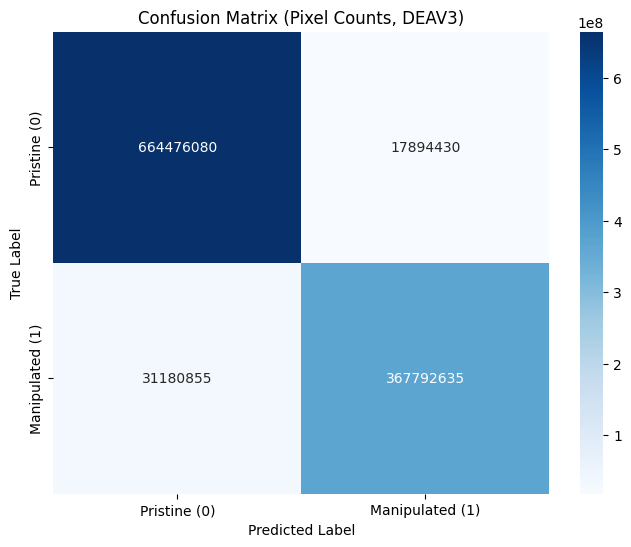

2025-10-24 17:26:59,307 [INFO] Saved DEAV3 confusion matrix plot to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots\confusion_matrix_raw_DEAV3.png
2025-10-24 17:26:59,309 [INFO] DEAV3 Confusion Matrix (raw): TN=664476080, FP=17894430, FN=31180855, TP=367792635
2025-10-24 17:26:59,309 [INFO] DEAV3 Confusion Matrix (after normalization): [[0.973776079508477, 0.026223920491523], [0.078152698817157, 0.921847301182843]]


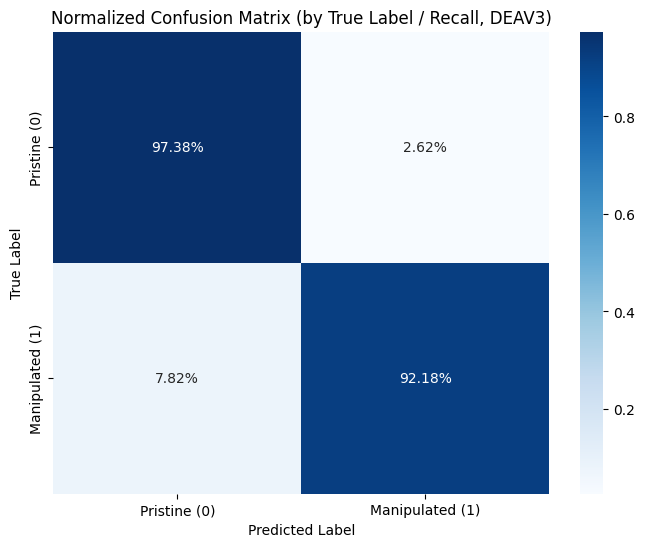

2025-10-24 17:26:59,484 [INFO] Saved DEAV3 confusion matrix plot to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots\confusion_matrix_normalized_true_DEAV3.png
2025-10-24 17:26:59,485 [INFO] DEAV3 Confusion Matrix (raw): TN=664476080, FP=17894430, FN=31180855, TP=367792635
2025-10-24 17:26:59,486 [INFO] DEAV3 Confusion Matrix (after normalization): [[0.9551778277032485, 0.046396240952493444], [0.044822172296751416, 0.9536037590475066]]


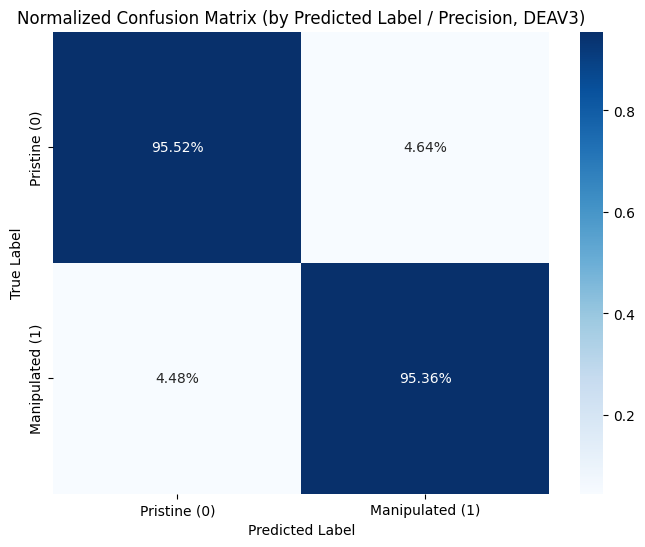

2025-10-24 17:26:59,653 [INFO] Saved DEAV3 confusion matrix plot to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots\confusion_matrix_normalized_pred_DEAV3.png
2025-10-24 17:26:59,653 [INFO] DEAV3 Confusion Matrix (raw): TN=664476080, FP=17894430, FN=31180855, TP=367792635
2025-10-24 17:26:59,653 [INFO] DEAV3 Confusion Matrix (after normalization): [[0.6144909298058712, 0.016548323197798295], [0.02883527813535748, 0.340125468860973]]


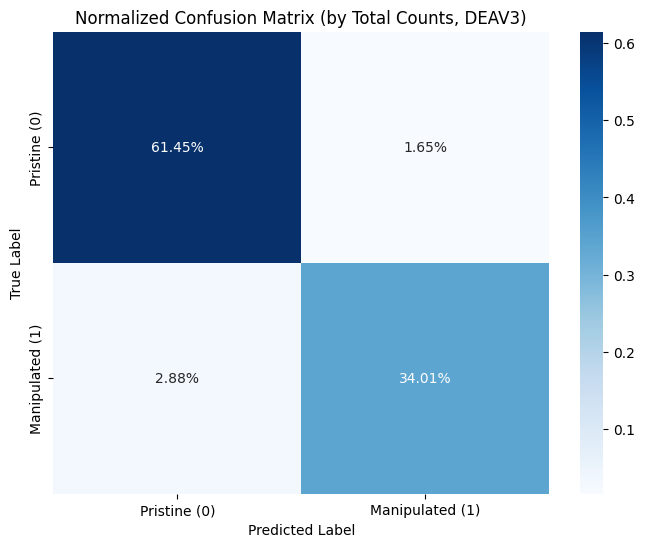

2025-10-24 17:26:59,814 [INFO] Saved DEAV3 confusion matrix plot to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots\confusion_matrix_normalized_all_DEAV3.png


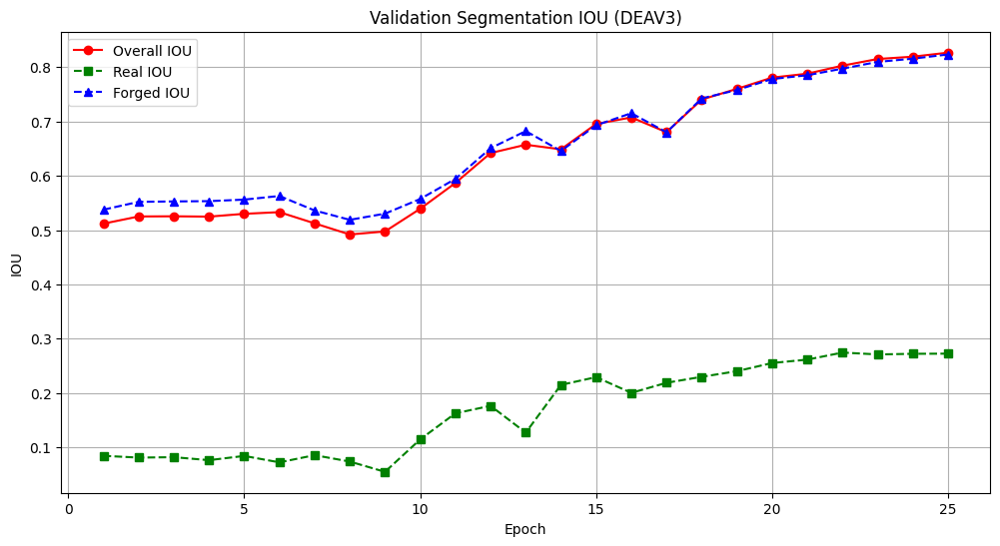

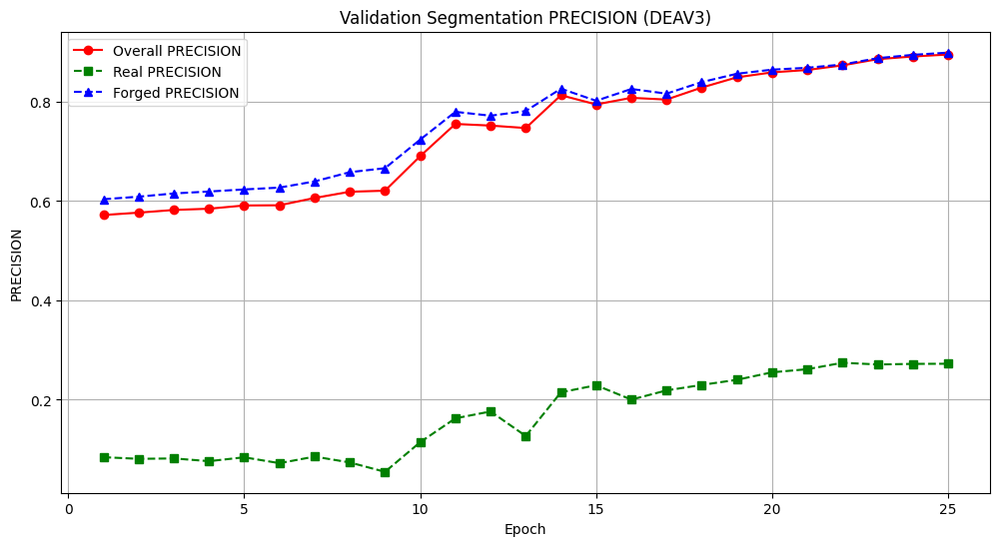

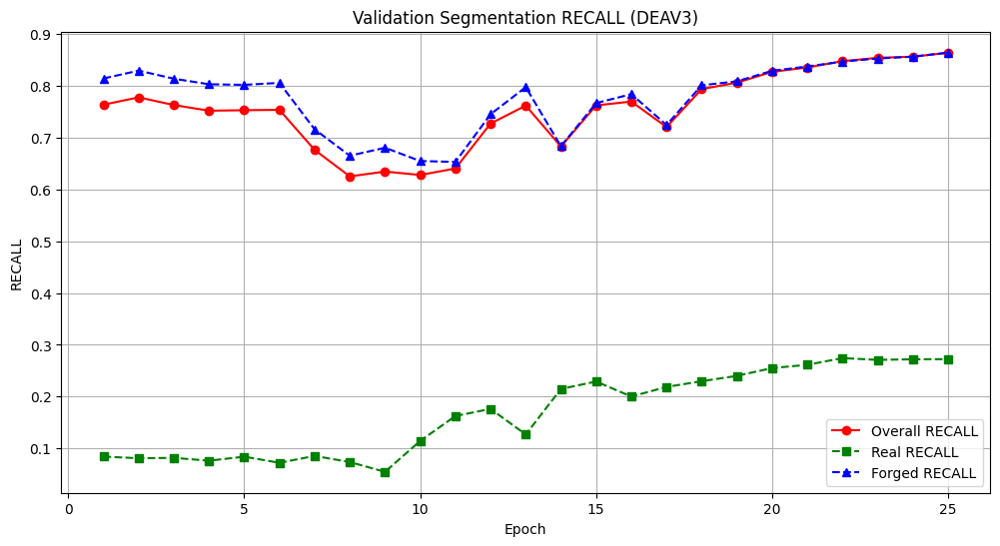

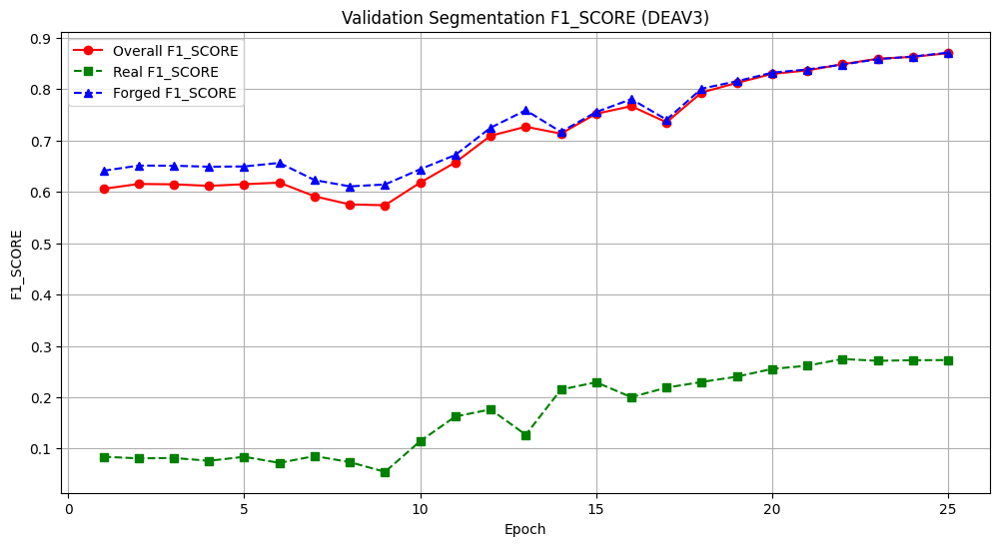

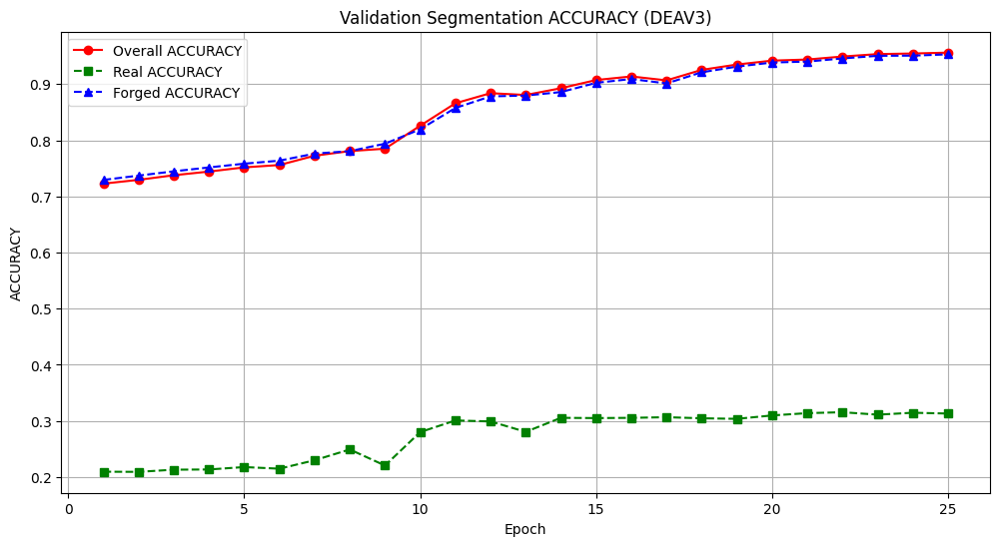

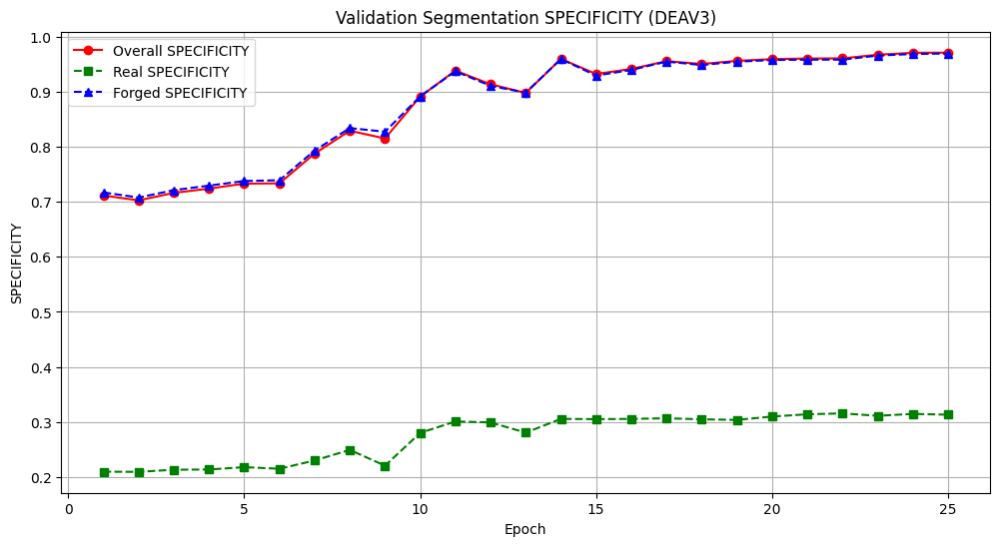

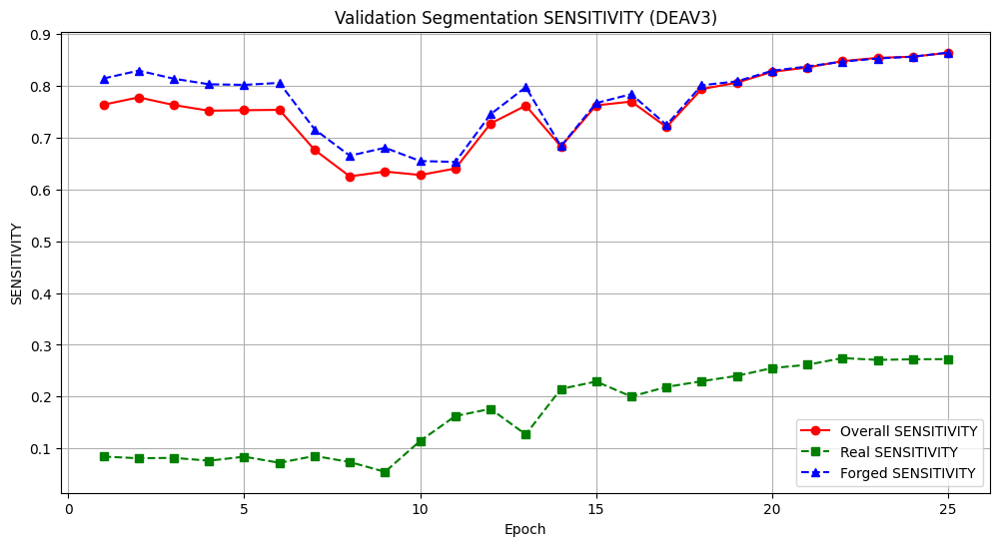

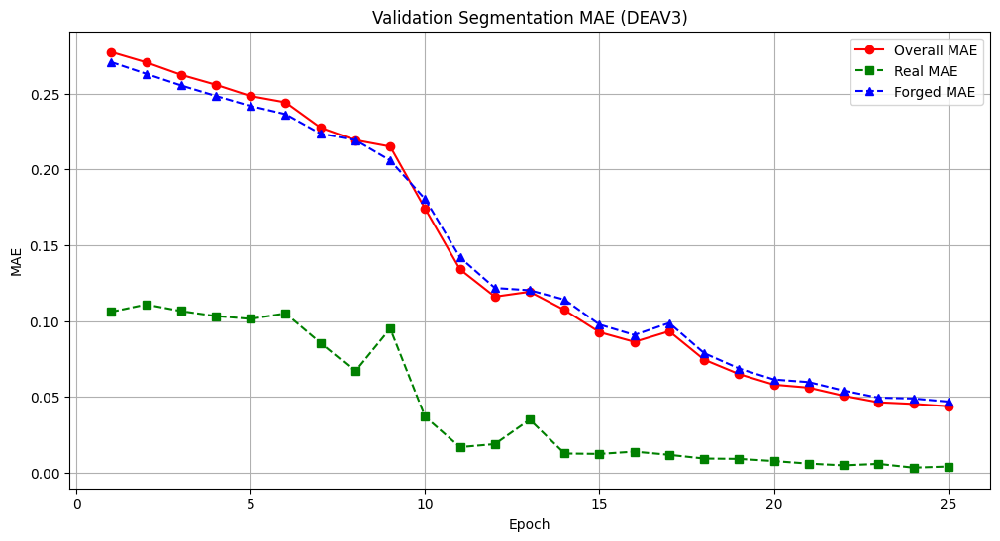

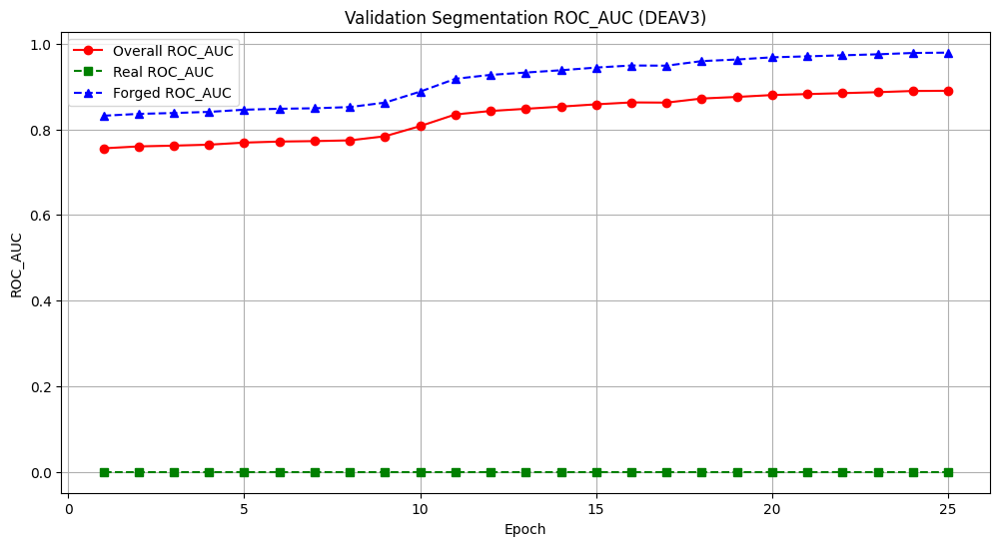

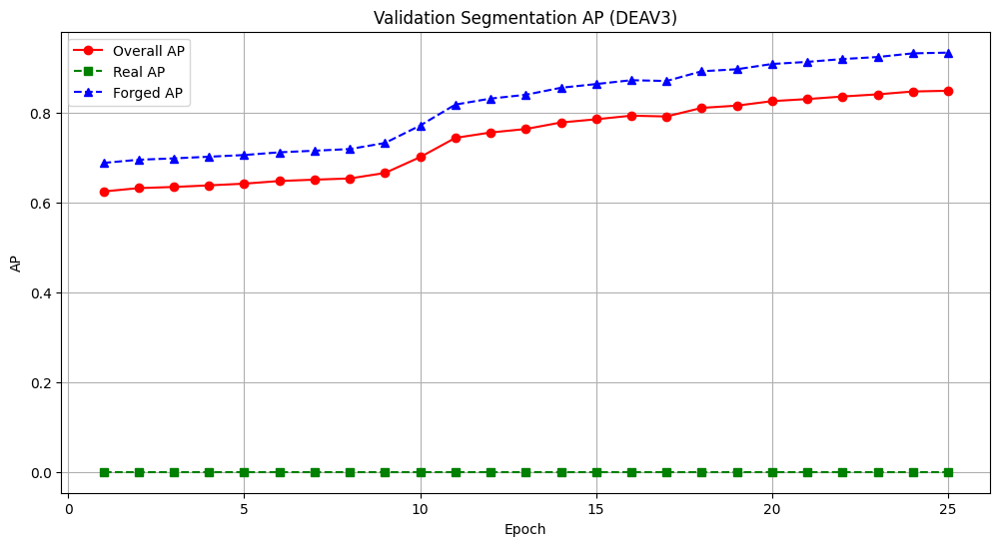

2025-10-24 17:27:02,254 [INFO] Saved DEAV3 metric plots to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots
2025-10-24 17:27:04,058 [INFO] Saving 5 DEAV3 prediction visualizations to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots...


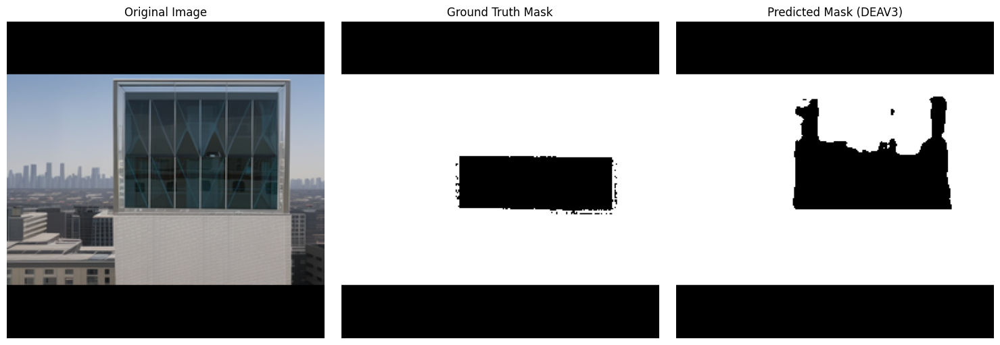

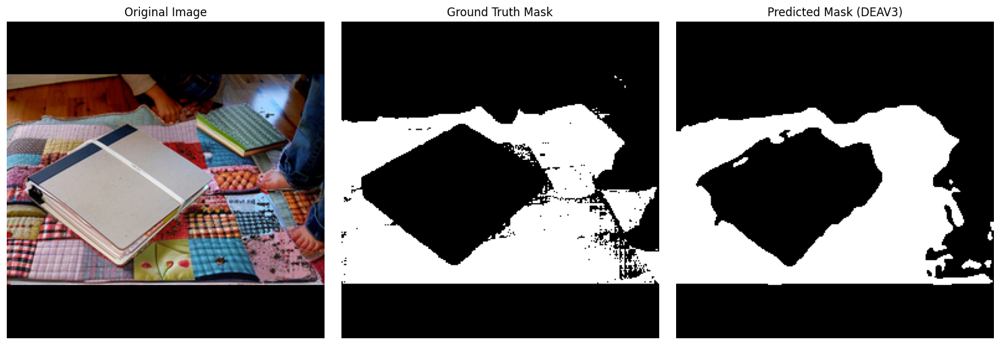

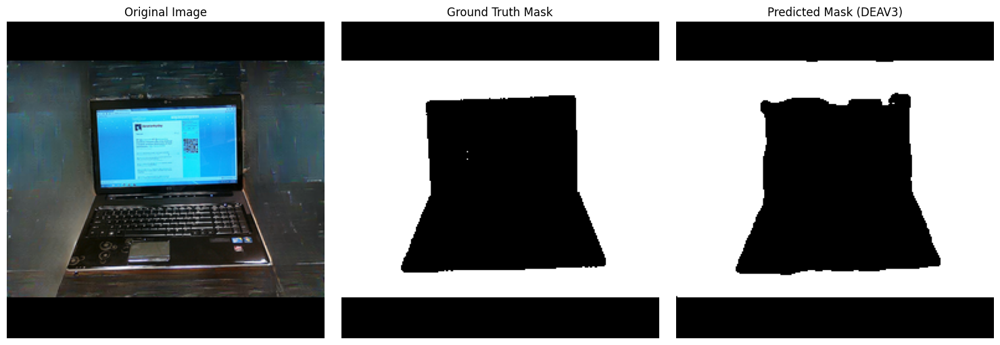

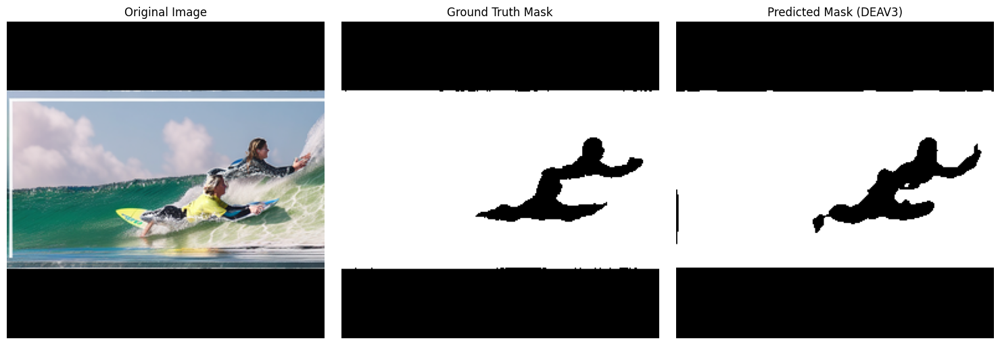

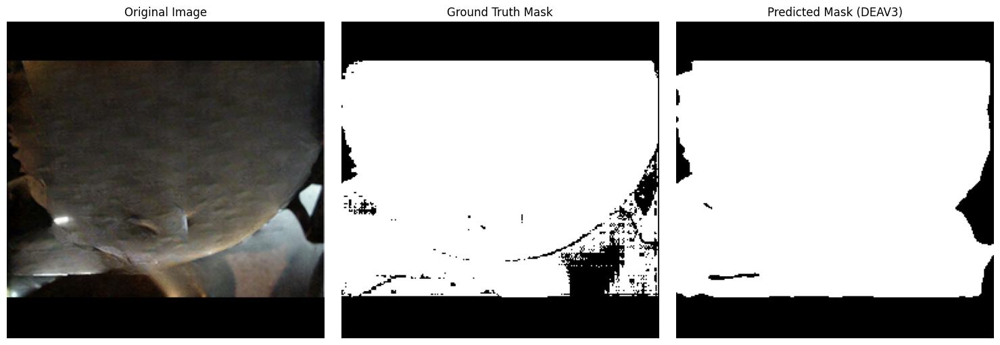

2025-10-24 17:27:09,916 [INFO] Saving 5 DEAV3 Grad-CAM (encoder) visualizations to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots...
2025-10-24 17:27:09,952 [INFO] Dataset item 1688: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:09,954 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:10,275 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:10,305 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:10,412 [INFO] SegmentationTarget output scalar: -422610.3125
2025-10-24 17:27:11,456 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


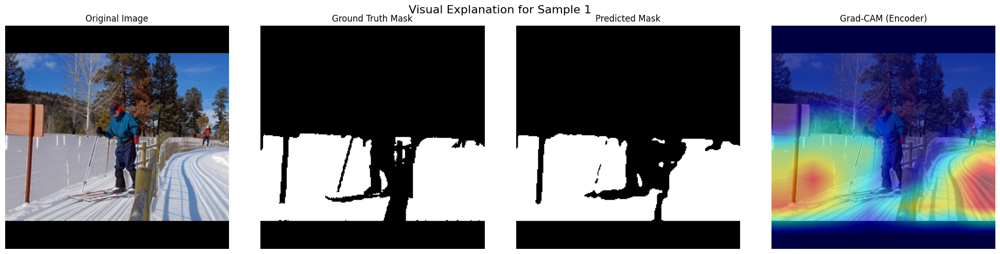

2025-10-24 17:27:12,469 [INFO] Dataset item 9969: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:12,470 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:12,555 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:12,574 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:12,668 [INFO] SegmentationTarget output scalar: -540609.125
2025-10-24 17:27:12,858 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


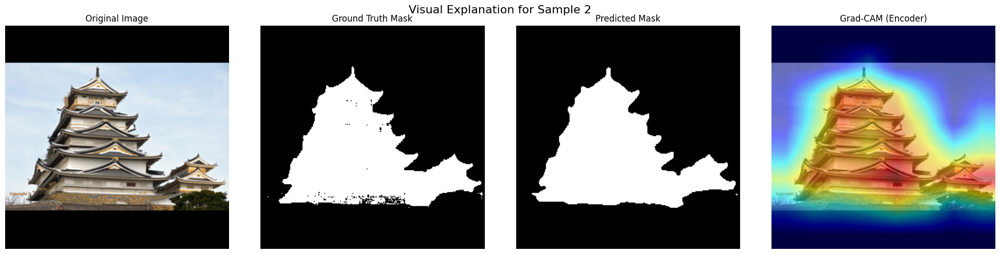

2025-10-24 17:27:13,595 [INFO] Dataset item 7032: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:13,597 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:13,662 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:13,668 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:13,670 [INFO] SegmentationTarget output scalar: -260233.203125
2025-10-24 17:27:13,805 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


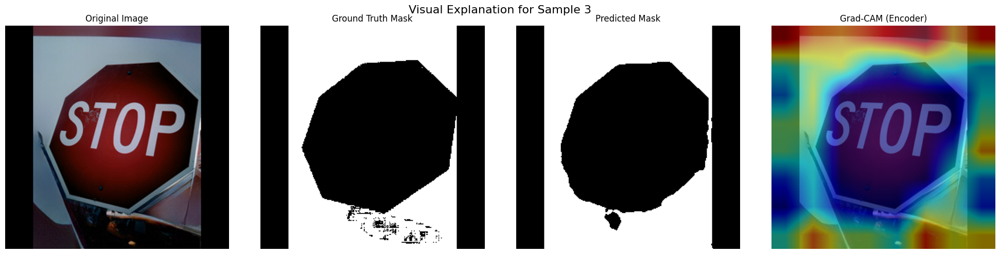

2025-10-24 17:27:14,590 [INFO] Dataset item 4746: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:14,592 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:14,658 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:14,672 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:14,674 [INFO] SegmentationTarget output scalar: -202553.296875
2025-10-24 17:27:14,834 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


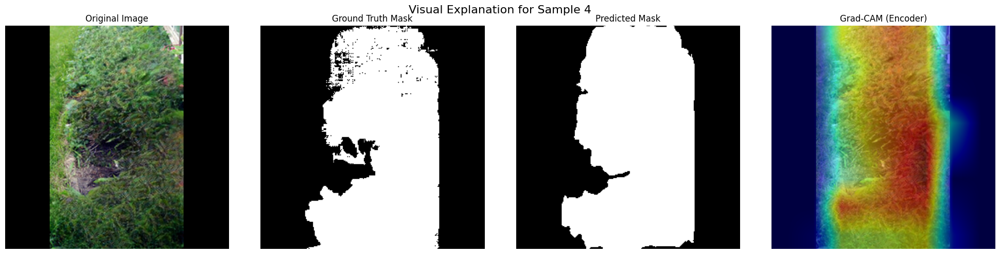

2025-10-24 17:27:15,556 [INFO] Dataset item 5112: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:15,558 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:15,614 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:15,621 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:15,627 [INFO] SegmentationTarget output scalar: 36630.6171875
2025-10-24 17:27:15,789 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


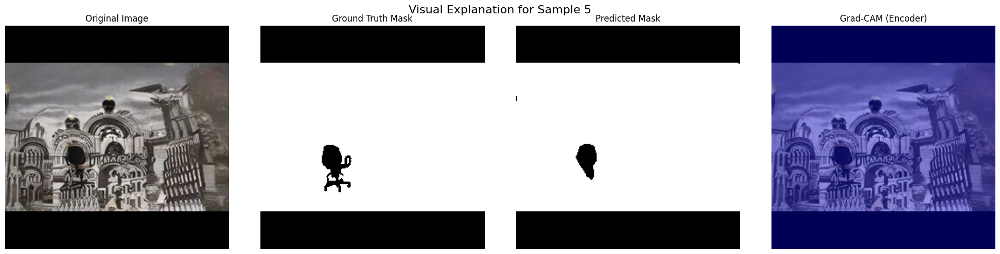

2025-10-24 17:27:16,527 [INFO] Saved 5 DEAV3 Grad-CAM visualizations for encoder to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots
2025-10-24 17:27:16,861 [INFO] Saving 5 DEAV3 Grad-CAM (fusion) visualizations to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots...
2025-10-24 17:27:16,867 [INFO] Dataset item 8710: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:16,867 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:16,936 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:16,940 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:16,954 [INFO] SegmentationTarget output scalar: -315103.8125
2025-10-24 17:27:17,117 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1,

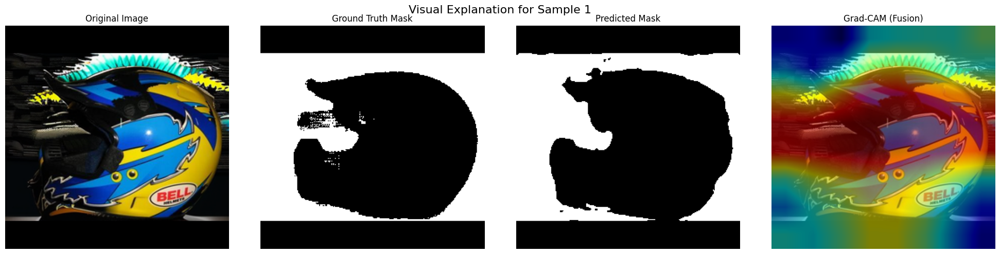

2025-10-24 17:27:17,889 [INFO] Dataset item 3670: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:17,891 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:17,973 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:17,981 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:17,984 [INFO] SegmentationTarget output scalar: 74494.4765625
2025-10-24 17:27:18,119 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


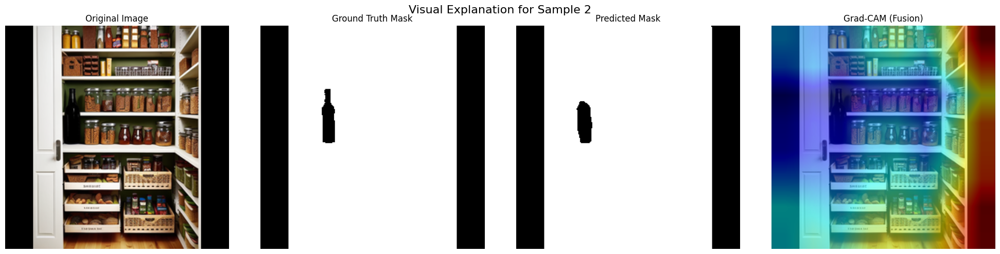

2025-10-24 17:27:18,921 [INFO] Dataset item 7541: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:18,923 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:18,999 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:19,006 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:19,008 [INFO] SegmentationTarget output scalar: -322612.3125
2025-10-24 17:27:19,145 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


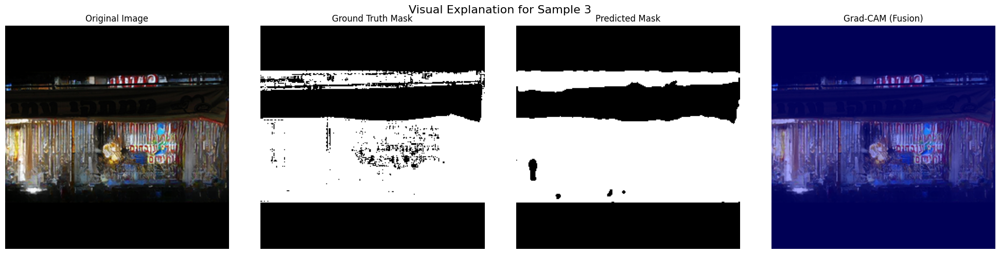

2025-10-24 17:27:19,868 [INFO] Dataset item 6916: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:19,870 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:19,946 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:19,955 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:19,956 [INFO] SegmentationTarget output scalar: 136178.4375
2025-10-24 17:27:20,094 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


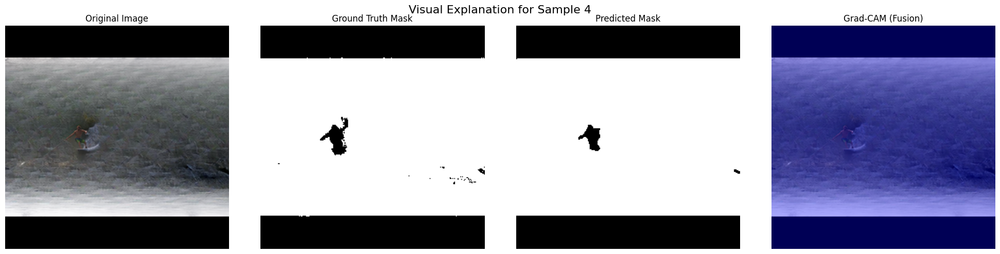

2025-10-24 17:27:20,879 [INFO] Dataset item 10061: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:20,880 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:20,964 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:20,974 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:20,975 [INFO] SegmentationTarget output scalar: 285471.0625
2025-10-24 17:27:21,119 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


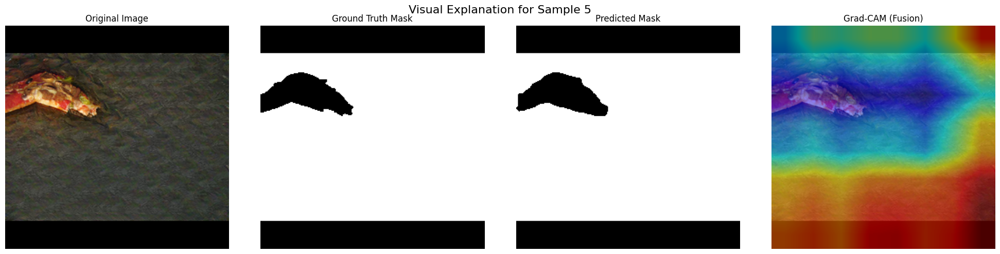

2025-10-24 17:27:21,964 [INFO] Saved 5 DEAV3 Grad-CAM visualizations for fusion to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots
2025-10-24 17:27:21,990 [INFO] Saving 5 DEAV3 Grad-CAM (decoder) visualizations to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots...
2025-10-24 17:27:22,001 [INFO] Dataset item 16376: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:22,003 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:22,088 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:22,092 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:22,108 [INFO] SegmentationTarget output scalar: -579984.75
2025-10-24 17:27:22,278 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 

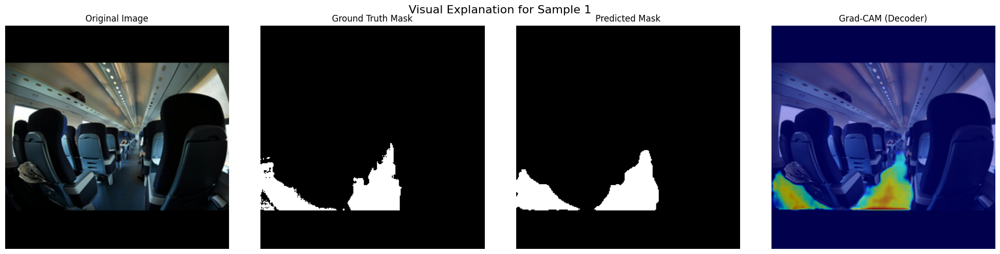

2025-10-24 17:27:22,995 [INFO] Dataset item 14982: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:22,995 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:23,112 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:23,118 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:23,125 [INFO] SegmentationTarget output scalar: -113228.71875
2025-10-24 17:27:23,270 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


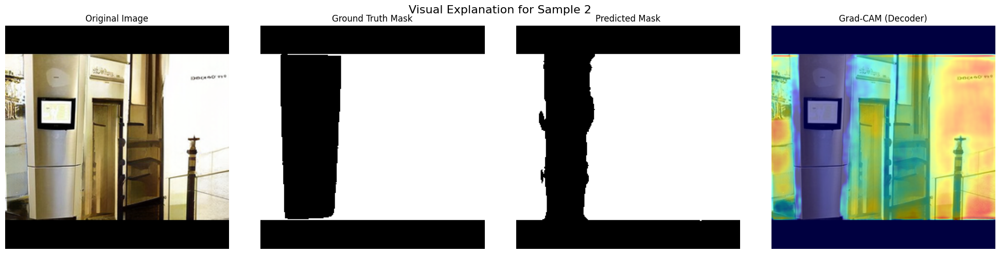

2025-10-24 17:27:24,052 [INFO] Dataset item 12609: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:24,054 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:24,123 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:24,131 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:24,134 [INFO] SegmentationTarget output scalar: 7276.41796875
2025-10-24 17:27:24,305 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


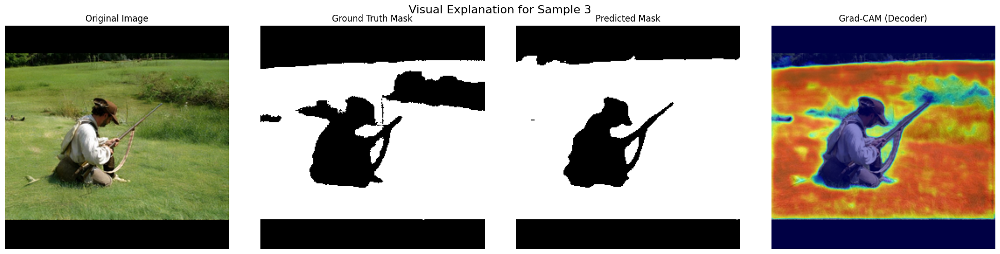

2025-10-24 17:27:25,573 [INFO] Dataset item 13469: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:25,575 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:25,670 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:25,682 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:25,750 [INFO] SegmentationTarget output scalar: -565289.625
2025-10-24 17:27:25,930 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


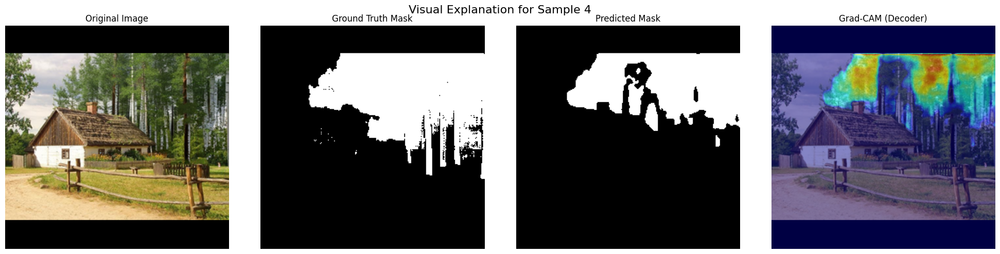

2025-10-24 17:27:26,850 [INFO] Dataset item 16045: input_tensor shape=torch.Size([3, 256, 256]), targets_dict keys=['mask', 'edge_mask', 'class_label']
2025-10-24 17:27:26,858 [INFO] Processed input_tensor shape: torch.Size([1, 3, 256, 256])
2025-10-24 17:27:26,946 [INFO] ModelOutputWrapper output shape: torch.Size([1, 1, 256, 256])
2025-10-24 17:27:26,953 [INFO] SegmentationTarget model_output shape: torch.Size([1, 256, 256])
2025-10-24 17:27:26,954 [INFO] SegmentationTarget output scalar: -275005.8125
2025-10-24 17:27:27,113 [INFO] Model output type: <class 'dict'>, keys: ['mask_logits', 'classification', 'noise_map', 'fused_features', 'edge_mask_logits', 'intermediate_features'], mask_logits shape: torch.Size([1, 1, 256, 256])


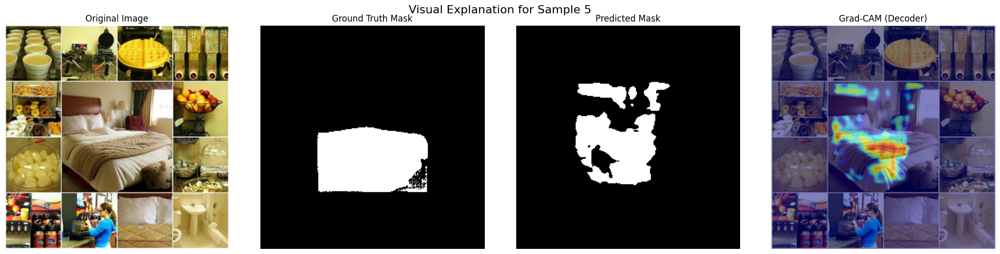

2025-10-24 17:27:27,975 [INFO] Saved 5 DEAV3 Grad-CAM visualizations for decoder to E:\A_CSE465\output_segmentation_DEA_SeqRefine\plots


In [26]:
# Visualize and save results
plot_confusion_matrix(confusion_matrix_values, PLOTS_DIR, model_type, normalize='none')
plot_confusion_matrix(confusion_matrix_values, PLOTS_DIR, model_type, normalize='true')
plot_confusion_matrix(confusion_matrix_values, PLOTS_DIR, model_type, normalize='pred')
plot_confusion_matrix(confusion_matrix_values, PLOTS_DIR, model_type, normalize='all')
plot_metrics(history, PLOTS_DIR, model_type)
visualize_predictions(model, test_loader, DEVICE, PLOTS_DIR, model_type, num_samples=5)
visualize_grad_cam(model, test_loader, DEVICE, PLOTS_DIR, model_type, num_samples=5, target_layer_name="encoder")
visualize_grad_cam(model, test_loader, DEVICE, PLOTS_DIR, model_type, num_samples=5, target_layer_name="fusion")
visualize_grad_cam(model, test_loader, DEVICE, PLOTS_DIR, model_type, num_samples=5, target_layer_name="decoder")

In [27]:
# Save final results to JSON
try:
    with open(RESULTS_PATH, 'w') as f:
        json.dump({model_type: final_results}, f, indent=4)
    logger.info(f"Saved final results to {RESULTS_PATH}")
except Exception as e:
    logger.error(f"Failed to save results to {RESULTS_PATH}: {e}")

2025-10-24 17:27:28,001 [INFO] Saved final results to E:\A_CSE465\output_segmentation_DEA_SeqRefine\test_results.json


In [28]:
# Cleanup
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
logger.info("Training and evaluation completed.")

2025-10-24 17:27:28,242 [INFO] Training and evaluation completed.
